# Sea Surface Slope Analysis

In [1]:
from swot_datahandler import *
from swot_datafunctions import *

# Load functions
import matplotlib.pyplot as plt
import numpy as np
import cartopy
import cartopy.crs as ccrs


In [23]:
# Settings
cycles = np.arange(495, 505+1).tolist()
print(cycles)

#cycles = np.arange(500, 577+1).tolist()

[495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505]


In [24]:
# Load Karin 2km data
#cycles = np.arange(474, 578+1).tolist()
path = "D:/MasterThesis/PreBetaKaRIn_1day/expert/*"
karin2 = loadKarinL2B(path, cycles=cycles, passes=[6,21])

Computing custom SSH variables


In [ ]:
AOI = [125, 135, 35, 42]
karin2 = karin_l2b_filtering(karin2,AOI,20,2,detrend=False)

In [ ]:
EXTERNAL_DATA_PATH = "D:\MasterThesis\GEBCO\*n45*.nc"

data_path = glob.glob(EXTERNAL_DATA_PATH)
file = nc.Dataset(data_path[0], "r")
keys = file.variables.keys()
gebco = {}
for k in keys:
    gebco[k] = np.ma.getdata(file.variables[k][:])
gebco_extent = [gebco["lon"].min(), gebco["lon"].max(), gebco["lat"].min(), gebco["lat"].max()]

In [ ]:
# Filter GEBCO data
x = gebco["elevation"]

# Setup kernel for filtering

filt_length_km = 40
ds = 0.46
fs = ds**(-1)
fac = 4
filtn = int(filt_length_km/ds)
if filt_length_km == 20:
    pm_kern = scipy.signal.remez(int(filtn*fac), [0, 30**(-1), 15**(-1), 0.5*fs], [1, 0], fs=fs)
elif filt_length_km == 40:
    pm_kern = scipy.signal.remez(int(filtn*fac), [0, 55**(-1), 30**(-1), 0.5*fs], [1, 0], fs=fs)
pm_hann = np.hanning(filtn)
pm_box = np.ones(filtn)
# Combine hann and PM filter
kern = np.outer(pm_kern, pm_kern)
kern /= kern.sum()
r = scipy.signal.fftconvolve(x, kern, mode="same")

gebco["long"] = r
gebco["short"] = gebco["elevation"] - r

Cycle 500


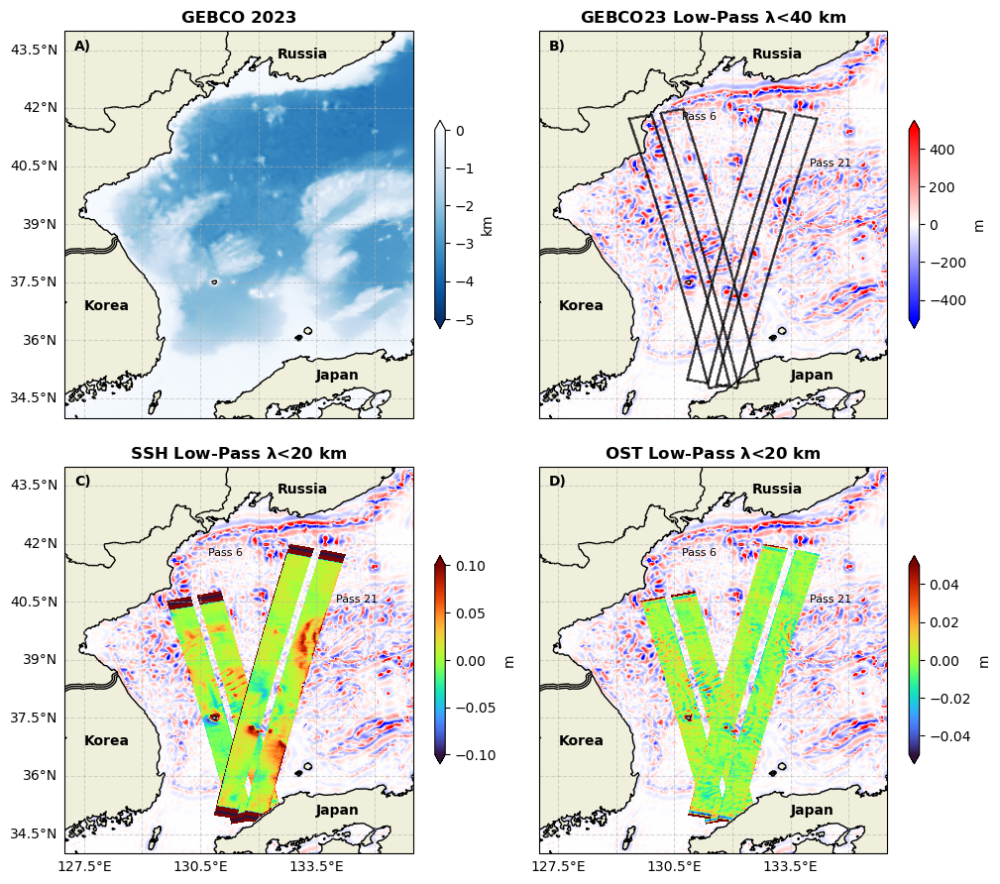

In [ ]:
AOI = [128, 135, 35, 43]

#c = list(karin2.keys())[1]
c = 500
print("Cycle",c)

fig = plt.figure(figsize=(10,9))

ax = fig.add_subplot(2,2,1, projection=ccrs.PlateCarree())
detrend = False
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS)

# Gebco
sc=ax.imshow(gebco["elevation"]/1e3, origin="lower", extent=gebco_extent, cmap="Blues_r", vmin=-5, vmax=0)

fig.colorbar(sc, label=r"km", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

ax.text(AOI[0]-0.75, AOI[3]+0.5, "A)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("GEBCO 2023", fontweight="bold")


ax = fig.add_subplot(2,2,2, projection=ccrs.PlateCarree())
detrend = False
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
gl.bottom_labels = False
ax.add_feature(cartopy.feature.BORDERS)

# Gebco short wavelength
sc=ax.imshow(gebco["short"], vmin=-500, vmax=500, origin="lower", cmap="bwr", extent=gebco_extent)

fig.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

for p in [6, 21]:
    key = "ssh_ellip_short"
    thickness = 0.1
    if p == 6:
        color = "k"
    elif p == 21:
        color = "k"

    # edges
    ax.scatter(karin2[c][p][key]["lon"][:,1], karin2[c][p][key]["lat"][:,1], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][:,61], karin2[c][p][key]["lat"][:,61], thickness, color)
    
    # center
    ax.scatter(karin2[c][p][key]["lon"][:,26], karin2[c][p][key]["lat"][:,26], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][:,36], karin2[c][p][key]["lat"][:,36], thickness, color)

    # ends
    ax.scatter(karin2[c][p][key]["lon"][0,1:27], karin2[c][p][key]["lat"][0,1:27], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][-1,1:27], karin2[c][p][key]["lat"][-1,1:27], thickness, color)
    
    ax.scatter(karin2[c][p][key]["lon"][0,36:62], karin2[c][p][key]["lat"][0,36:62], thickness, color)
    ax.scatter(karin2[c][p][key]["lon"][-1,36:62], karin2[c][p][key]["lat"][-1,36:62], thickness, color)

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "B)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("GEBCO23 Low-Pass $\mathbf{\lambda}}$<40 km", fontweight="bold")


ax = fig.add_subplot(2,2,3, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cartopy.feature.BORDERS)

ax.imshow(gebco["short"], vmin=-500, vmax=500, origin="lower", cmap="bwr", extent=gebco_extent)
# KaRIn
for p in karin2[c].keys():
    key = "ssh_ellip_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.1, vmax=0.1)

fig.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "C)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("SSH Low-Pass $\mathbf{\lambda}}$<20 km", fontweight="bold")


ax = fig.add_subplot(2,2,4, projection=ccrs.PlateCarree())
detrend = True
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle="--")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False
ax.add_feature(cartopy.feature.BORDERS)

ax.imshow(gebco["short"], vmin=-500, vmax=500, origin="lower", cmap="bwr", extent=gebco_extent)
# KaRIn
for p in karin2[c].keys():
    key = "ssh_geoid_short"
    ssh = karin2[c][p][key]["ssh"]
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], ssh, cmap="turbo", vmin=-0.05, vmax=0.05)

fig.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")

ax.text(134.0, 40.5, "Pass 21", fontsize=8)
ax.text(130.7, 41.7, "Pass 6", fontsize=8)
ax.text(AOI[0]-0.75, AOI[3]+0.5, "D)", fontweight="bold")

ax.text(133.5, 35, "Japan", fontweight="bold")
#ax.annotate("Japan", (133.5, 35), (133.5, 35), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(127.5, 36.8, "Korea", fontweight="bold")
#ax.annotate("Korea", (127.5, 36.8), (127.5, 36.8), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
ax.text(132.5, 43.3, "Russia", fontweight="bold")
#ax.annotate("Russia", (132.5, 43.3), (132.5, 43.3), fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
#ax.set_title("Data Extent", fontweight="bold")
ax.set_extent(np.array(AOI)+np.array([-1,1,-1,1])*1, crs=ccrs.PlateCarree())
ax.set_title("OST Low-Pass $\mathbf{\lambda}}$<20 km", fontweight="bold")

plt.tight_layout(pad=0.0)
plt.show()


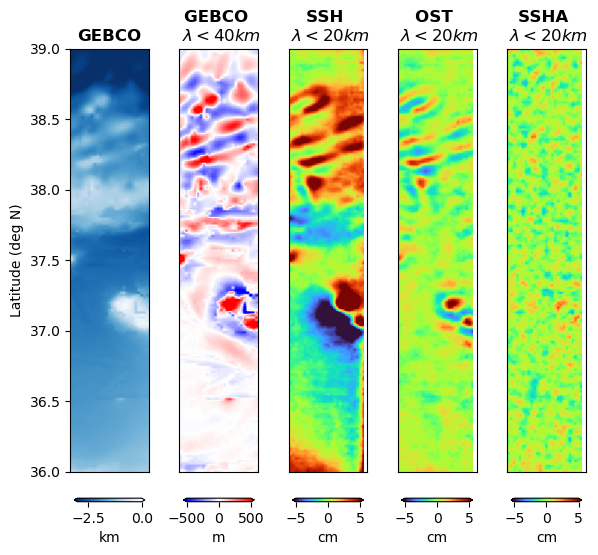

In [ ]:
fig = plt.figure(figsize=(6,6))

ylims = [36, 39]

ax = fig.add_subplot(1,5,1)

p = 6
key = "ssh_mss_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]

shape = lat.shape
fn = scipy.interpolate.RegularGridInterpolator((gebco["lon"], gebco["lat"]), gebco["elevation"].T, method="cubic")
intp_val = fn(np.c_[lon.reshape(-1), lat.reshape(-1)]).reshape(lat.shape)
#intp_val = np.flipud(np.fliplr(intp_val))

sc=ax.imshow(intp_val/1e3, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="Blues_r", vmin=-3, vmax=0)
ax.set_xticks([])
ax.set_ylim(ylims)
ax.set_title("GEBCO", fontweight="bold")
ax.set_ylabel("Latitude (deg N)")

fig.colorbar(sc, label=r"km", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")


ax = fig.add_subplot(1,5,2)

p = 6
key = "ssh_mss_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]

shape = lat.shape
fn = scipy.interpolate.RegularGridInterpolator((gebco["lon"], gebco["lat"]), gebco["short"].T, method="cubic")
intp_val = fn(np.c_[lon.reshape(-1), lat.reshape(-1)]).reshape(lat.shape)
#intp_val = np.flipud(np.fliplr(intp_val))

sc=ax.imshow(intp_val, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="bwr", vmin=-500, vmax=500)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("GEBCO \n $\lambda<40km$", fontweight="bold")

fig.colorbar(sc, label=r"m", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

ax = fig.add_subplot(1,5,3)

p = 6
key = "ssh_ellip_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]
sc=ax.imshow(ssh*100, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="turbo", vmin=-5, vmax=5)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("SSH \n $\lambda<20km$", fontweight="bold")

fig.colorbar(sc, label=r"cm", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

ax = fig.add_subplot(1,5,4)

p = 6
key = "ssh_geoid_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]
sc=ax.imshow(ssh*100, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="turbo", vmin=-5, vmax=5)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("OST \n $\lambda<20km$", fontweight="bold")

fig.colorbar(sc, label=r"cm", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

ax = fig.add_subplot(1,5,5)

p = 6
key = "ssh_mss_short"
lat = karin2[c][p][key]["lat"]
lon = karin2[c][p][key]["lon"]
lat = np.flipud(np.fliplr(lat))
lon = np.flipud(np.fliplr(lon))
lon = lon[:,39:66]
lat = lat[:,39:66]
ssh = karin2[c][p][key]["ssh"]
ssh = np.flipud(np.fliplr(ssh))
ssh = ssh[:,39:66]
sc=ax.imshow(ssh*100, extent=[lon[0,:].min(), lon[0,:].max(), lat[:,0].min(), lat[:,0].max()], origin="lower", cmap="turbo", vmin=-5, vmax=5)
ax.set_xticks([])
ax.set_yticks([])
ax.set_ylim(ylims)
ax.set_title("SSHA \n $\lambda<20km$", fontweight="bold")

fig.colorbar(sc, label=r"cm", orientation="horizontal", shrink=0.9, pad=0.05, extend="both")

plt.tight_layout()
plt.show()

## Ojin Seamount

In [2]:
# Setup settings
AOI = [169,172,37,39]


In [3]:

# Load Karin 2km data
#cycles = np.arange(474, 578+1).tolist()
path = "D:/MasterThesis/PreBetaKaRIn_21day/expert/*"
karin2 = loadKarinL2B(path, cycles=[5], passes=[168, 183, 196, 211, 461, 474, 489])


Computing custom SSH variables


In [ ]:
# Load and plot GEBCO23
EXTERNAL_DATA_PATH = "D:\MasterThesis\GEBCO\*n39.0*.nc"

data_path = glob.glob(EXTERNAL_DATA_PATH)
file = nc.Dataset(data_path[0], "r")
keys = file.variables.keys()
gebco = {}
for k in keys:
    gebco[k] = np.ma.getdata(file.variables[k][:])
gebco_extent = [gebco["lon"].min(), gebco["lon"].max(), gebco["lat"].min(), gebco["lat"].max()]


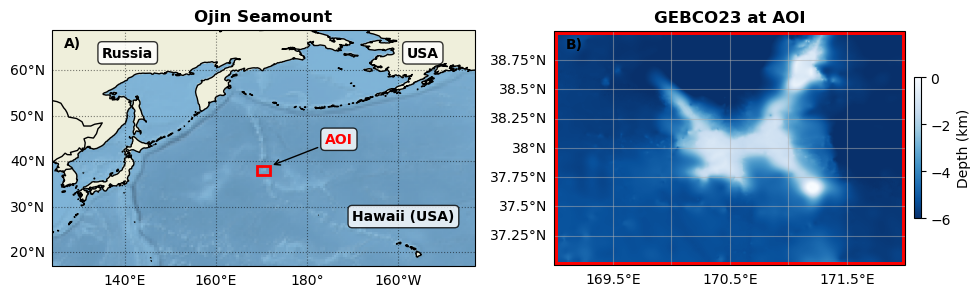

In [ ]:
fig = plt.figure(figsize=(10,5))

ax = fig.add_subplot(1, 2, 1, projection=ccrs.PlateCarree(central_longitude=180))
ax.coastlines(resolution='50m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5, color="k",linestyle=":")
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cartopy.feature.LAND, zorder=0)
import matplotlib.ticker as mticker
gl.xlocator = mticker.FixedLocator([i for i in range(120, 180, 20)]+[i for i in range(-180, -150, 20)])

ax.set_title("Ojin Seamount", fontweight="bold")

ax.stock_img()

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='r', facecolor='None', transform=ccrs.PlateCarree()))

ax.set_extent(AOI+np.array([-0.9,0.9,-0.4,0.6])*50, crs=ccrs.PlateCarree())

ax.annotate("Russia", (135, 63), (135, 63),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("USA", (-158, 63), (-158, 63),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("Hawaii (USA)", (-170, 27), (-170, 27),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("AOI", (AOI[1], AOI[3]), (AOI[0]+15, AOI[2]+7),
            fontweight="bold", color="r", arrowprops=dict(facecolor='red',arrowstyle="->",edgecolor="k"),
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())

ax.text(AOI[0]-0.9*47, AOI[2]+0.6*47, "A)", fontweight="bold", transform=ccrs.PlateCarree())

ax = fig.add_subplot(1, 2, 2, projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False
sc=ax.imshow(gebco["elevation"]/1e3, extent=gebco_extent, origin="lower", cmap="Blues_r", vmin=-6, vmax=0)
ax.set_title("GEBCO23 at AOI", fontweight="bold")
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=5, edgecolor='r', facecolor='None', transform=ccrs.PlateCarree()))
plt.colorbar(sc, label="Depth (km)", shrink=0.3, pad=0.02)
ax.set_extent(AOI, crs=ccrs.PlateCarree())

ax.text(AOI[0]+0.1, AOI[3]-0.15, "B)", fontweight="bold", transform=ccrs.PlateCarree())

plt.tight_layout()
plt.show()

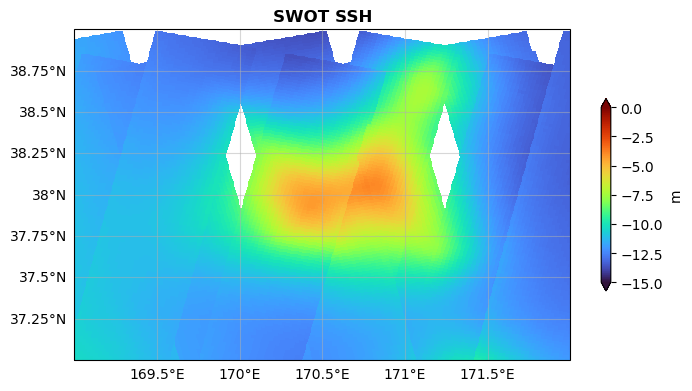

In [101]:
# Show KaRIn data in Area of Interest

PLOTEXTENT = [165, 175, AOI[2]-5, AOI[3]+5]

c = 5

fig = plt.figure(figsize=(8,5))


ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
ax.coastlines(resolution='10m')
ax.add_feature(cartopy.feature.LAND)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False


for p in karin2[c].keys():
    latmask = np.logical_and(karin2[c][p]["latitude"][:,0]>AOI[2], karin2[c][p]["latitude"][:,0]<AOI[3])
    latmask = np.logical_and(latmask, karin2[c][p]["latitude"][:,-1]<AOI[3])
    latmask = np.logical_and(latmask, karin2[c][p]["latitude"][:,-1]<AOI[3])
    sc=ax.pcolormesh(karin2[c][p]["longitude"][latmask], karin2[c][p]["latitude"][latmask], karin2[c][p]["ssh_ellip"][latmask], cmap="turbo", vmin=-15, vmax=0)


ax.set_title("SWOT SSH", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")
#plt.legend(["Data Area"])

plt.show()

In [102]:
karin2 = karin_l2b_filtering(karin2,AOI,2,2,detrend=False,type="hann")

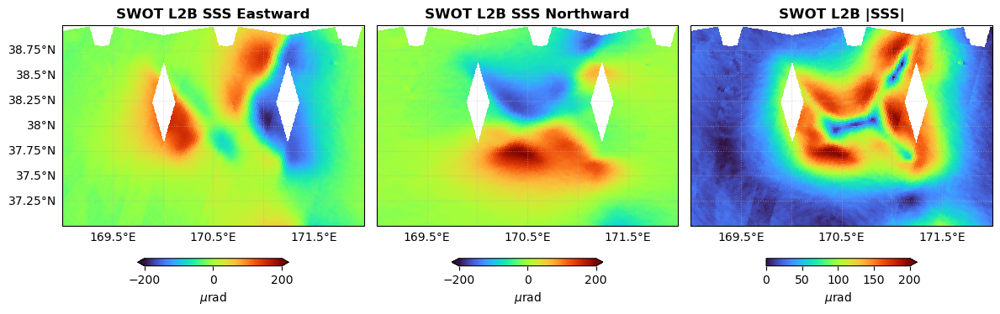

In [103]:
# Show computed KaRIn Gradients

c = 5

fig = plt.figure(figsize=(12,8))

ax = fig.add_subplot(1,3,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False

for p in karin2[c].keys():
    key = "ssh_ellip_full"
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], karin2[c][p][key]["sss_x"], cmap="turbo", vmin=-200, vmax=200)

ax.set_title("SWOT L2B SSS Eastward", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="both")


ax = fig.add_subplot(1,3,2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False


for p in karin2[c].keys():
    key = "ssh_ellip_full"
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], karin2[c][p][key]["sss_y"], cmap="turbo", vmin=-200, vmax=200)

ax.set_title("SWOT L2B SSS Northward", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="both")


ax = fig.add_subplot(1,3,3, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False


for p in karin2[c].keys():
    key = "ssh_ellip_full"
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], karin2[c][p][key]["sss_mag"], cmap="turbo", vmin=0, vmax=200)

ax.set_title("SWOT L2B |SSS|", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="max")

plt.tight_layout()
plt.show()

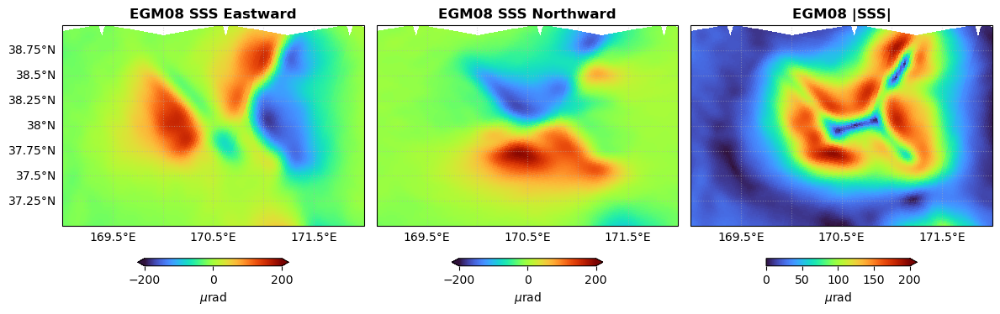

In [104]:
# Show computed KaRIn Gradients

c = 5

fig = plt.figure(figsize=(12,8))

ax = fig.add_subplot(1,3,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False

for p in karin2[c].keys():
    key = "ssh_ellip_full"
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], karin2[c][p][key]["egm_sss_x"], cmap="turbo", vmin=-200, vmax=200)

ax.set_title("EGM08 SSS Eastward", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="both")


ax = fig.add_subplot(1,3,2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False


for p in karin2[c].keys():
    key = "ssh_ellip_full"
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], karin2[c][p][key]["egm_sss_y"], cmap="turbo", vmin=-200, vmax=200)

ax.set_title("EGM08 SSS Northward", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="both")


ax = fig.add_subplot(1,3,3, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False


for p in karin2[c].keys():
    key = "ssh_ellip_full"
    sc=ax.pcolormesh(karin2[c][p][key]["lon"], karin2[c][p][key]["lat"], karin2[c][p][key]["egm_sss_mag"], cmap="turbo", vmin=0, vmax=200)

ax.set_title("EGM08 |SSS|", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
plt.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="max")

plt.tight_layout()
plt.show()

In [105]:
# Interpolate Gradients

# For kriging
import pykrige.kriging_tools as kt
from pykrige.ok import OrdinaryKriging

# Interpolate Gradients

# ===========================================================
# SWOT
# Y axis
c = 5
decimate = 4
N = 100
lon_steps = np.linspace(AOI[0], AOI[1], int(N)) # Longitude
lat_steps = np.linspace(AOI[2], AOI[3], N) # Latitude
grid_locs = np.meshgrid(lon_steps, lat_steps)

points = np.array([[],[]]).T
values = np.array([])
for p in karin2[c].keys():
    points_ = np.c_[karin2[c][p]["ssh_ellip_full"]["lon"][::decimate,::decimate].reshape(-1), karin2[c][p]["ssh_ellip_full"]["lat"][::decimate,::decimate].reshape(-1)]
    values_ = karin2[c][p]["ssh_ellip_full"]["sss_y"][::decimate,::decimate].reshape(-1)# + bias[idx]
    mask = np.logical_and(points_[:,0]>AOI[0],points_[:,0]<AOI[1])
    mask = np.logical_and(mask,points_[:,1]>AOI[2])
    mask = np.logical_and(mask,points_[:,1]<AOI[3])
    mask = np.logical_and(mask,~np.isnan(values_))
    points_ = points_[mask,:]
    values_ = values_[mask]

    points = np.r_[points, points_]
    values = np.r_[values, values_]

# Convert lon from -180:180 to 0:360
points[points[:,0]<0, 0] -= 360

interp = OrdinaryKriging(points[:,0],
                         points[:,1],
                         values,
                         variogram_model="exponential",
                         variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},
                         verbose=False,
                         enable_plotting=False,
                         coordinates_type="geographic")

sss_y_grid, sss_y_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 100)
print("SSS y done")

# x axis
#lon_steps = np.linspace(AOI[0], AOI[1], int(N*(1+1.5))) # Longitude
#lat_steps = np.linspace(AOI[2], AOI[3], N) # Latitude
#grid_locs = np.meshgrid(lon_steps, lat_steps)

points = np.array([[],[]]).T
values = np.array([])
for p in karin2[c].keys():
    points_ = np.c_[karin2[c][p]["ssh_ellip_full"]["lon"][::decimate,::decimate].reshape(-1), karin2[c][p]["ssh_ellip_full"]["lat"][::decimate,::decimate].reshape(-1)]
    values_ = karin2[c][p]["ssh_ellip_full"]["sss_x"][::decimate,::decimate].reshape(-1)# + bias[idx]
    mask = np.logical_and(points_[:,0]>AOI[0],points_[:,0]<AOI[1])
    mask = np.logical_and(mask,points_[:,1]>AOI[2])
    mask = np.logical_and(mask,points_[:,1]<AOI[3])
    mask = np.logical_and(mask,~np.isnan(values_))
    points_ = points_[mask,:]
    values_ = values_[mask]

    points = np.r_[points, points_]
    values = np.r_[values, values_]

# Convert lon from -180:180 to 0:360
points[points[:,0]<0, 0] -= 360
    
## Run kriging
# variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},

interp = OrdinaryKriging(points[:,0],
                         points[:,1],
                         values,
                         variogram_model="exponential",
                         variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},
                         verbose=False,
                         enable_plotting=False,
                         coordinates_type="geographic")

sss_x_grid, sss_x_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 100)
print("SSS x done")

# ===========================================================
# EGM08
# Y axis
points = np.array([[],[]]).T
values = np.array([])
for p in karin2[c].keys():
    points_ = np.c_[karin2[c][p]["ssh_ellip_full"]["lon"][::decimate,::decimate].reshape(-1), karin2[c][p]["ssh_ellip_full"]["lat"][::decimate,::decimate].reshape(-1)]
    values_ = karin2[c][p]["ssh_ellip_full"]["egm_sss_y"][::decimate,::decimate].reshape(-1)# + bias[idx]
    mask = np.logical_and(points_[:,0]>AOI[0],points_[:,0]<AOI[1])
    mask = np.logical_and(mask,points_[:,1]>AOI[2])
    mask = np.logical_and(mask,points_[:,1]<AOI[3])
    mask = np.logical_and(mask,~np.isnan(values_))
    points_ = points_[mask,:]
    values_ = values_[mask]

    points = np.r_[points, points_]
    values = np.r_[values, values_]

# Convert lon from -180:180 to 0:360
points[points[:,0]<0, 0] -= 360

interp = OrdinaryKriging(points[:,0],
                         points[:,1],
                         values,
                         variogram_model="exponential",
                         variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},
                         verbose=False,
                         enable_plotting=False,
                         coordinates_type="geographic")

egm_sss_y_grid, egm_sss_y_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 100)
print("SSS egm y done")

# x axis
points = np.array([[],[]]).T
values = np.array([])
for p in karin2[c].keys():
    points_ = np.c_[karin2[c][p]["ssh_ellip_full"]["lon"][::decimate,::decimate].reshape(-1), karin2[c][p]["ssh_ellip_full"]["lat"][::decimate,::decimate].reshape(-1)]
    values_ = karin2[c][p]["ssh_ellip_full"]["egm_sss_x"][::decimate,::decimate].reshape(-1)# + bias[idx]
    mask = np.logical_and(points_[:,0]>AOI[0],points_[:,0]<AOI[1])
    mask = np.logical_and(mask,points_[:,1]>AOI[2])
    mask = np.logical_and(mask,points_[:,1]<AOI[3])
    mask = np.logical_and(mask,~np.isnan(values_))
    points_ = points_[mask,:]
    values_ = values_[mask]

    points = np.r_[points, points_]
    values = np.r_[values, values_]

# Convert lon from -180:180 to 0:360
points[points[:,0]<0, 0] -= 360
    
## Run kriging
# variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},

interp = OrdinaryKriging(points[:,0],
                         points[:,1],
                         values,
                         variogram_model="exponential",
                         variogram_parameters = {'sill': 8, 'range': 1, 'nugget': 0.2},
                         verbose=False,
                         enable_plotting=False,
                         coordinates_type="geographic")

egm_sss_x_grid, egm_sss_x_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 100)
print("SSS egm x done")

SSS y done
SSS x done
SSS egm y done
SSS egm x done


In [106]:
print("Lon step {:.2f} deg".format(np.mean(np.diff(lon_steps))))
print("Lat step {:.2f} deg".format(np.mean(np.diff(lat_steps))))
print("Lat step {:.2f} km".format(np.mean(np.diff(lat_steps))*111))

Lon step 0.03 deg
Lat step 0.02 deg
Lat step 2.24 km


Mean diff x -1.85 urad
rms x 5.23 urad
corr x 0.9994

Mean diff y -0.35 urad
rms y 4.27 urad
corr y 0.9997

Mean diff mag 1.80 urad
rms mag 4.86 urad
corr mag 0.9994


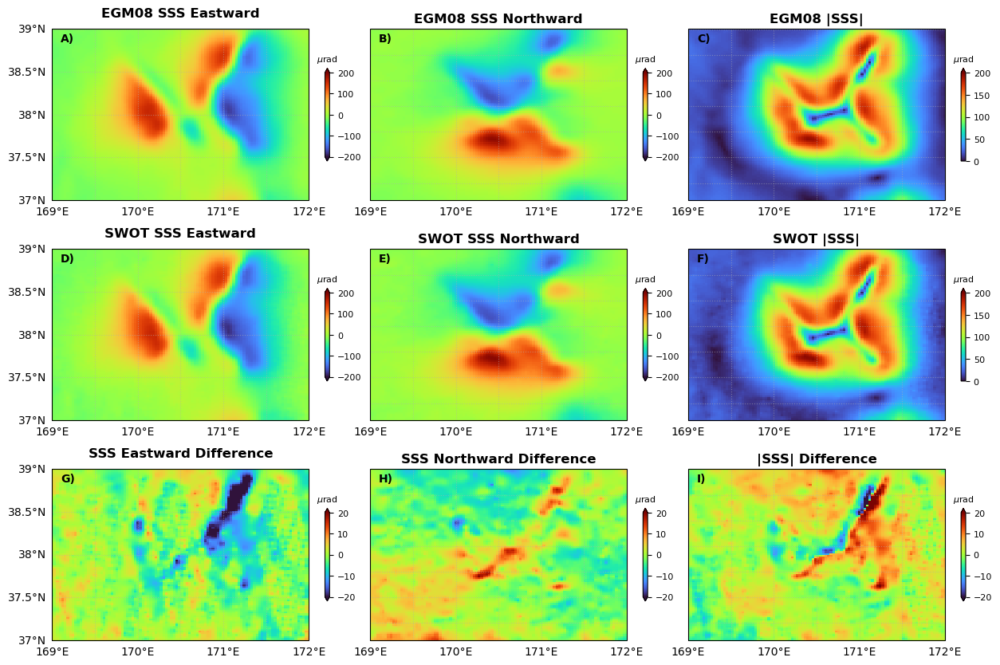

In [107]:
# Plot interpolated gradients

c = 5

fig = plt.figure(figsize=(12,8))

ax = fig.add_subplot(3,3,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], egm_sss_x_grid, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("EGM08 SSS Eastward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "A)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], egm_sss_y_grid, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("EGM08 SSS Northward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "B)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,3, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], np.sqrt(egm_sss_x_grid**2 + egm_sss_y_grid**2), cmap="turbo", vmin=0, vmax=200)

ax.set_title("EGM08 |SSS|", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "C)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,4, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_x_grid, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("SWOT SSS Eastward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "D)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,5, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_y_grid, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("SWOT SSS Northward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "E)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,6, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], np.sqrt(sss_x_grid**2 + sss_y_grid**2), cmap="turbo", vmin=0, vmax=200)

ax.set_title("SWOT |SSS|", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "F)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,7, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_x_grid - egm_sss_x_grid, cmap="turbo", vmin=-20, vmax=20)

ax.set_title("SSS Eastward Difference", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "G)", fontweight="bold", transform=ccrs.PlateCarree())
print("Mean diff x {:.2f} urad".format(np.mean(sss_x_grid - egm_sss_x_grid)))
print("rms x {:.2f} urad".format( np.sqrt( np.mean( (sss_x_grid - egm_sss_x_grid)**2 ) ) ))
print("corr x {:.4f}".format( np.corrcoef(sss_x_grid, egm_sss_x_grid)[1,0] ))

ax = fig.add_subplot(3,3,8, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_y_grid - egm_sss_y_grid, cmap="turbo", vmin=-20, vmax=20)

ax.set_title("SSS Northward Difference", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "H)", fontweight="bold", transform=ccrs.PlateCarree())
print("")
print("Mean diff y {:.2f} urad".format(np.mean(sss_y_grid - egm_sss_y_grid)))
print("rms y {:.2f} urad".format( np.sqrt( np.mean( (sss_y_grid - egm_sss_y_grid)**2 ) ) ))
print("corr y {:.4f}".format( np.corrcoef(sss_y_grid, egm_sss_y_grid)[1,0] ))


ax = fig.add_subplot(3,3,9, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

mag_err = np.sqrt(sss_x_grid**2 + sss_y_grid**2) - np.sqrt(egm_sss_x_grid**2 + egm_sss_y_grid**2)
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], mag_err , cmap="turbo", vmin=-20, vmax=20)

ax.set_title("|SSS| Difference", fontweight="bold")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "I)", fontweight="bold", transform=ccrs.PlateCarree())
print("")
print("Mean diff mag {:.2f} urad".format(np.mean(mag_err)))
print("rms mag {:.2f} urad".format( np.sqrt( np.mean( (mag_err)**2 ) ) ))
print("corr mag {:.4f}".format( np.corrcoef(np.sqrt(sss_x_grid**2 + sss_y_grid**2),
                                            np.sqrt(egm_sss_x_grid**2 + egm_sss_y_grid**2))[1,0] ))

ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())

plt.tight_layout(pad=-2)
plt.show()

c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\scipy\signal\_spectral_py.py:2014: UserWarning: nperseg = 256 is greater than input length  = 100, using nperseg = 100
  warnings.warn('nperseg = {0:d} is greater than input length '


Lambda 0.5 coherence: 10.19 km
Lambda 0.5 coherence: 7.23 km


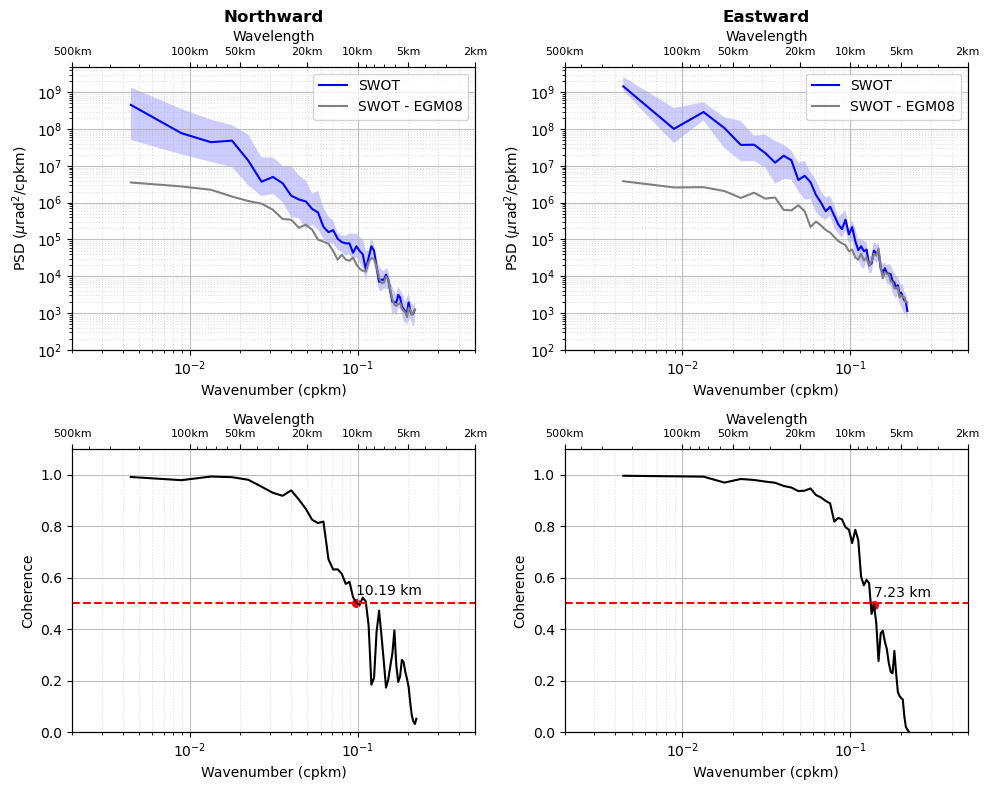

In [ ]:


fig = plt.figure(figsize=(10,8))

# =========================================================================================
ax = fig.add_subplot(2,2,1)
sampling_size = np.mean(np.diff(lat_steps))*111 * 1000

# KaRIn PIXC along
ssh = []
for i in range(sss_x_grid.shape[1]):
    X = np.sqrt(sss_x_grid[:,i]**2 + sss_y_grid[:,i]**2)
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")
ax.loglog(k, psd, 'blue')
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn PIXC along
ssh = []
for i in range(egm_sss_x_grid.shape[1]):
    X = np.sqrt(sss_x_grid[:,i]**2 + sss_y_grid[:,i]**2) -\
        np.sqrt(egm_sss_x_grid[:,i]**2 + egm_sss_y_grid[:,i]**2)
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")
ax.loglog(k, psd, "gray")

ax.set_title("Northward", fontweight="bold")

ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel(r"PSD ($\mu$rad$^2$/cpkm)")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([1e2, 5e9])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

#ax.set_title("Right Swath")
plt.legend(["SWOT", "SWOT - EGM08"])

# Create second axis
ax.set_xlim([500**(-1), 2**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim([500, 2])
ticks_km = [500, 100, 50, 20, 10, 5, 2]
ticks_loc = ticks_km
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_text = ticks_km

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)
# =========================================================================================


# =========================================================================================
ax = fig.add_subplot(2,2,2)
sampling_size = np.mean(np.diff(lat_steps))*111 * 1000

# KaRIn PIXC cross
ssh = []
for j in range(sss_x_grid.shape[0]):
    X = np.sqrt(sss_x_grid[j,:]**2 + sss_y_grid[j,:]**2)
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")
ax.loglog(k, psd, 'blue')
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn PIXC along
ssh = []
for j in range(egm_sss_x_grid.shape[0]):
    X = np.sqrt(sss_x_grid[j,:]**2 + sss_y_grid[j,:]**2) -\
        np.sqrt(egm_sss_x_grid[j,:]**2 + egm_sss_y_grid[j,:]**2)
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="cm")
ax.loglog(k, psd, "gray")

ax.set_title("Eastward", fontweight="bold")


ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel(r"PSD ($\mu$rad$^2$/cpkm)")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([1e2, 5e9])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

#ax.set_title("Right Swath")
plt.legend(["SWOT", "SWOT - EGM08"])

# Create second axis
ax.set_xlim([500**(-1), 2**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim([500, 2])
ticks_km = [500, 100, 50, 20, 10, 5, 2]
ticks_loc = ticks_km
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_text = ticks_km

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)
# =========================================================================================

# =========================================================================================
ax = fig.add_subplot(2,2,3)

# Coherence calcs
ssh_a = []
ssh_b = []
for i in range(sss_x_grid.shape[1]):
    X = np.sqrt(sss_x_grid[:,i]**2 + sss_y_grid[:,i]**2)
    ssh_a.append(X)
    X = np.sqrt(egm_sss_x_grid[:,i]**2 + egm_sss_y_grid[:,i]**2)
    ssh_b.append(X)

k = []
Pxy_list = []
for i in range(len(ssh_a)):
    k, Pxy = scipy.signal.csd(ssh_a[i], ssh_b[i], fs=(sampling_size/1e3)**(-1))
    Pxy_list.append(Pxy)
Pxy = np.array(Pxy_list).mean(axis=0)
Pxy = Pxy[1:]

Pxx_list = []
for i in range(len(ssh_a)):
    k, Pxx = scipy.signal.csd(ssh_a[i], ssh_a[i], fs=(sampling_size/1e3)**(-1))
    Pxx_list.append(Pxx)
Pxx = np.array(Pxx_list).mean(axis=0)
Pxx = Pxx[1:]

Pyy_list = []
for i in range(len(ssh_b)):
    k, Pyy = scipy.signal.csd(ssh_b[i], ssh_b[i], fs=(sampling_size/1e3)**(-1))
    Pyy_list.append(Pyy)
Pyy = np.array(Pyy_list).mean(axis=0)
Pyy = Pyy[1:]
k = k[1:]

Cxy = abs(Pxy)**2 / (Pxx * Pyy) 
# https://en.wikipedia.org/wiki/Coherence_(signal_processing)

ax.plot(k, Cxy, 'k')

ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Coherence")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([0, 1.1])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

ax.hlines(0.5, 500**(-1), 2**(-1), linestyle="--", color="r")
argmin = np.argmin(abs(Cxy - 0.5))
print("Lambda 0.5 coherence: {:.2f} km".format(k[argmin]**(-1)))
ax.scatter(k[argmin], Cxy[argmin], 30, "r")
ax.text(k[argmin], Cxy[argmin]+0.03, "{:.2f} km".format(k[argmin]**(-1)))


# Create second axis
ax.set_xlim([500**(-1), 2**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim([500, 2])
ticks_km = [500, 100, 50, 20, 10, 5, 2]
ticks_loc = ticks_km
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_text = ticks_km

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)


# =========================================================================================
ax = fig.add_subplot(2,2,4)

# Coherence calcs
ssh_a = []
ssh_b = []
for j in range(sss_x_grid.shape[0]):
    X = np.sqrt(sss_x_grid[j,:]**2 + sss_y_grid[j,:]**2)
    ssh_a.append(X)
    X = np.sqrt(egm_sss_x_grid[j,:]**2 + egm_sss_y_grid[j,:]**2)
    ssh_b.append(X)

k = []
Pxy_list = []
for i in range(len(ssh_a)):
    k, Pxy = scipy.signal.csd(ssh_a[i], ssh_b[i], fs=(sampling_size/1e3)**(-1))
    Pxy_list.append(Pxy)
Pxy = np.array(Pxy_list).mean(axis=0)
Pxy = Pxy[1:]

Pxx_list = []
for i in range(len(ssh_a)):
    k, Pxx = scipy.signal.csd(ssh_a[i], ssh_a[i], fs=(sampling_size/1e3)**(-1))
    Pxx_list.append(Pxx)
Pxx = np.array(Pxx_list).mean(axis=0)
Pxx = Pxx[1:]

Pyy_list = []
for i in range(len(ssh_b)):
    k, Pyy = scipy.signal.csd(ssh_b[i], ssh_b[i], fs=(sampling_size/1e3)**(-1))
    Pyy_list.append(Pyy)
Pyy = np.array(Pyy_list).mean(axis=0)
Pyy = Pyy[1:]
k = k[1:]

Cxy = abs(Pxy)**2 / (Pxx * Pyy) 
# https://en.wikipedia.org/wiki/Coherence_(signal_processing)

ax.plot(k, Cxy, 'k')

ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Coherence")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([0, 1.1])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

ax.hlines(0.5, 500**(-1), 2**(-1), linestyle="--", color="r")
argmin = np.argmin(abs(Cxy - 0.5))
print("Lambda 0.5 coherence: {:.2f} km".format(k[argmin]**(-1)))
ax.scatter(k[argmin], Cxy[argmin], 30, "r")
ax.text(k[argmin], Cxy[argmin]+0.03, "{:.2f} km".format(k[argmin]**(-1)))

# Create second axis
ax.set_xlim([500**(-1), 2**(-1)])
ax2 = ax.twiny()
ax2.set_xlabel("Wavelength")
ax2.set_xscale("log")
ax2.set_xlim([500, 2])
ticks_km = [500, 100, 50, 20, 10, 5, 2]
ticks_loc = ticks_km
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_text = ticks_km

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)

plt.tight_layout()
plt.show()

### ICESat-2 comparison

In [351]:
# Load ICESat-2 ATL12

import h5py

# Settings
filenames = glob.glob("D:/MasterThesis/ICESat-2_ATL12/ATL12*.h5")
data_bin_subkeys = ["beam", "lat", "lon", "time", "time_seg", "ssh_ellip", "ssh_geoid", "ssh_mss", "slope_cross", "slope_along",
                     "granule_qual", "sc_orient", "sc_orient_time", "pod", "ref_azimuth", "ref_elev"]
geophys_keys = ["dac_seg", "tide_earth_seg", "tide_load_seg", "tide_oc_pole_seg", "tide_ocean_seg", "tide_pole_seg"]
beams_r = ['gt1r', 'gt2r', 'gt3r']
beams_l = ['gt1l', 'gt2l', 'gt3l']

# Breakup settings
buffer = 0
min_lat = 37-buffer
max_lat = 39+buffer
min_lon = 169-buffer
max_lon = 172+buffer

atl12 = {}
for i, filename in enumerate(filenames):
    print("File {} out of {} files".format(i+1, len(filenames)),end="\r")

    # Determine RGT
    rgt = filename[52:58]
    atl12[rgt] = {}

    # Load file
    try:
        atl12_file = h5py.File(filename)
    except:
        atl12.pop(rgt)
        continue
    
    # Check which beams are the strong beams
    # ICESat-2 is considered to be flying forward when the weak beams are leading the strong beams; 
    # and backward when the strong beams are leading the weak beams.
    # Orientation flag: 0: backward, 1: forward, 2: transition
    sc_orientation = atl12_file["orbit_info"]["sc_orient"][:][0]
    if sc_orientation == 0:
        beams = beams_l
    elif sc_orientation == 1:
        beams = beams_r

    # Setup keys without the l/r tag
    for b in beams:
        atl12[rgt][b[:-1]] = {}
    
    # Get subsection of data
    tot_seg_items = 0
    for b in beams:
        b_file = b
        b = b[:-1]
        lat = atl12_file[b_file]["ssh_segments"]["latitude"][:]
        lon = atl12_file[b_file]["ssh_segments"]["longitude"][:]
        lat_mask = np.logical_and(lat > min_lat, lat < max_lat)
        lon_mask = np.logical_and(lon > min_lon, lon < max_lon)
        data_mask = np.logical_and(lat_mask, lon_mask)

        tot_seg_items += data_mask.sum()
        if data_mask.sum() == 0:
            atl12[rgt].pop(b)
            continue

        # Get geophysical corrections
        geophys_corr = np.zeros(lat[data_mask].shape)
        for gk in geophys_keys:
            geophys_corr += atl12_file[b_file]["ssh_segments"]["stats"][gk][data_mask]

        for k in data_bin_subkeys:
            match k:
                case "beam":
                    atl12[rgt][b][k] = b_file
                case "lat":
                    atl12[rgt][b][k] = lat[data_mask]
                case "lon":
                    atl12[rgt][b][k] = lon[data_mask]
                case "time":
                    atl12[rgt][b][k] = atl12_file[b_file]["ssh_segments"]["delta_time"][data_mask]
                case "time_seg":
                    atl12[rgt][b][k] = atl12_file[b_file]["ssh_segments"]["delt_seg"][data_mask]
                case "ssh_ellip":
                    atl12[rgt][b][k] = atl12_file[b_file]["ssh_segments"]["heights"]["h"][data_mask] - geophys_corr
                case "granule_qual":
                    atl12[rgt][b][k] = atl12_file["quality_assessment"]["qa_granule_fail_reason"][:][0]
                case "sc_orient":
                    atl12[rgt][b][k] = sc_orientation
                case "sc_orient_time":
                    atl12[rgt][b][k] = atl12_file["orbit_info"]["sc_orient_time"][:][0]
                case "pod":
                    atl12[rgt][b][k] = atl12_file[b_file]["ssh_segments"]["stats"]["podppd_flag_seg"][data_mask]
                case "ref_azimuth":
                    atl12[rgt][b][k] = atl12_file[b_file]["ssh_segments"]["stats"]["ref_azimuth_seg"][data_mask]
                case "ref_elev":
                    atl12[rgt][b][k] = atl12_file[b_file]["ssh_segments"]["stats"]["ref_elev_seg"][data_mask]


    if tot_seg_items == 0:
        atl12.pop(rgt)

First ATL12 data: 2019-01-07 00:01:57.853474
Last ATL12 data:  2023-08-05 16:17:21.835914


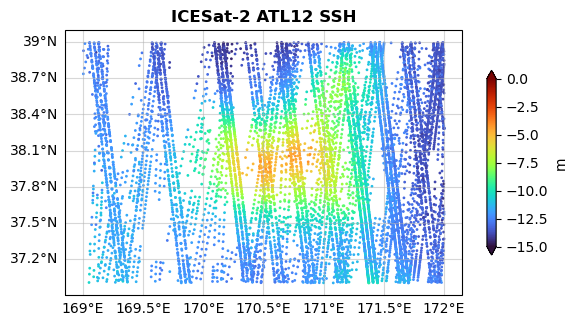

In [352]:
# Plot ICESat-2 ATL12 SSH

# times
c = list(atl12.keys())
first_date = datetime.datetime(2018,1,1) + datetime.timedelta(seconds=np.mean(atl12[c[0]]["gt1"]["time"]))
last_date = datetime.datetime(2018,1,1) + datetime.timedelta(seconds=np.mean(atl12[c[-1]]["gt1"]["time"]))
print("First ATL12 data: {}".format(first_date))
print("Last ATL12 data:  {}".format(last_date))


fig = plt.figure()
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False

for r in atl12.keys():
    for b in atl12[r].keys():
        sc=ax.scatter(atl12[r][b]["lon"], atl12[r][b]["lat"], 1, atl12[r][b]["ssh_ellip"], cmap="turbo", vmin=-15, vmax=0)


from matplotlib.patches import Rectangle
#ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='r', facecolor='None', transform=ccrs.PlateCarree()))

ax.set_title("ICESat-2 ATL12 SSH", fontweight="bold")
#ax.set_extent(AOI, crs=ccrs.PlateCarree())
fig.colorbar(sc, label="m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")
plt.show()

In [234]:
# Function
def haversine_dist(lat1, lon1, lat2, lon2):
    # Distance between coordinates using the haversine equation
    # Approximates the earth as a sphere
    R = 6373.0

    lat1 = np.deg2rad(lat1)
    lon1 = np.deg2rad(lon1)
    lat2 = np.deg2rad(lat2)
    lon2 = np.deg2rad(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c
    
    return distance

In [353]:
# Perform computations on ATL12 data

# Settings
max_interpolation_length = 5 # seconds
lat_spacing_deg = 0.05

keys_to_remove = []
for rgt in atl12.keys():
    if (("gt1" in list(atl12[rgt].keys())) == False) or (("gt2" in list(atl12[rgt].keys())) == False) or (("gt3" in list(atl12[rgt].keys())) == False):
        keys_to_remove.append(rgt)
        continue
    #if ("gt3" in list(atl12[rgt].keys())) == False:
    #    continue

    # Get time segment ends
    t0 = atl12[rgt]["gt2"]["time"][0]
    t1 = atl12[rgt]["gt2"]["time"][-1]

    # Create 1Hz steps
    #t = np.arange(t0, t1, 1)
    t_separation = np.arange(t0, t1, 1)
    lat = np.arange(37, 39, lat_spacing_deg)

    # Determine time jump size from real data
    time_step_size = np.diff(atl12[rgt]["gt1"]["time"])
    time_step_size = np.r_[0, time_step_size]

    # Perform linear interpolation
    t_ = atl12[rgt]["gt1"]["time"]    
    lat_ = atl12[rgt]["gt1"]["lat"]
    lon_ = atl12[rgt]["gt1"]["lon"]
    h_ = atl12[rgt]["gt1"]["ssh_ellip"]
    h_[time_step_size>max_interpolation_length] = np.nan # Insert nans where the jump is too large
    
    if t_separation.size <= 2:
        #for b in ["gt1", "gt2", "gt3"]:
        #    atl12[rgt][b]["seg_time"] = np.nan
        #    atl12[rgt][b]["seg_ssh_ellip"] = np.nan
        #    atl12[rgt][b]["seg_lat"] = np.nan
        #    atl12[rgt][b]["seg_lon"] = np.nan
        #    atl12[rgt][b]["yaw"] = np.nan
        
        keys_to_remove.append(rgt)
        continue

    
    f = scipy.interpolate.interp1d(lat_, h_, kind="linear", fill_value=np.nan, bounds_error=False)
    h = f(lat)

    f = scipy.interpolate.interp1d(lat_, t_, kind="linear", fill_value=np.nan, bounds_error=False)
    t = f(lat)

    f = scipy.interpolate.interp1d(lat_, lon_, kind="linear", fill_value=np.nan, bounds_error=False)
    lon = f(lat)

    atl12[rgt]["gt1"]["seg_time"] = t
    atl12[rgt]["gt1"]["seg_ssh_ellip"] = h
    atl12[rgt]["gt1"]["seg_lat"] = lat
    atl12[rgt]["gt1"]["seg_lon"] = lon

    # Determine orbit angle
    t_yaw = np.arange(t0, t1, 1)
    f = scipy.interpolate.interp1d(t_, lat_, kind="linear", fill_value=np.nan, bounds_error=False)
    lat_yaw = f(t_yaw)
    f = scipy.interpolate.interp1d(t_, lon_, kind="linear", fill_value=np.nan, bounds_error=False)
    lon_yaw = f(t_yaw)
    first_lon = np.nanmin(lon_yaw)
    first_lat = np.nanmin(lat_yaw)
    easting = -(lon_yaw-first_lon)*40075*np.cos(np.deg2rad(lat_yaw)) / 360
    northing = (lat_yaw-first_lat)*111

    yaw = np.rad2deg(-np.arctan2( np.diff(easting) , np.diff(northing) ))
    yaw = np.r_[yaw[0], yaw]
    yaw = np.nanmean(yaw)
    yaw = np.repeat(yaw, repeats=lat.size)
    
    atl12[rgt]["gt1"]["yaw"] = yaw
    atl12[rgt]["gt2"]["yaw"] = yaw
    atl12[rgt]["gt3"]["yaw"] = yaw

    # Determine segments in the middle
    t_m_ = atl12[rgt]["gt2"]["time"]
    lat_m_ = atl12[rgt]["gt2"]["lat"]
    lon_m_ = atl12[rgt]["gt2"]["lon"]
    h_m_ = atl12[rgt]["gt2"]["ssh_ellip"]
    time_step_size = np.diff(atl12[rgt]["gt2"]["time"])
    time_step_size = np.r_[0, time_step_size]
    h_m_[time_step_size>max_interpolation_length] = np.nan # Insert nans where the jump is too large
    
    f = scipy.interpolate.interp1d(t_m_, h_m_, kind="linear", fill_value=np.nan, bounds_error=False)
    h_m = f(t)
    f = scipy.interpolate.interp1d(t_m_, lat_m_, kind="linear", fill_value=np.nan, bounds_error=False)
    lat_m = f(t)
    f = scipy.interpolate.interp1d(t_m_, lon_m_, kind="linear", fill_value=np.nan, bounds_error=False)
    lon_m= f(t)

    atl12[rgt]["gt2"]["seg_time"] = t
    atl12[rgt]["gt2"]["seg_ssh_ellip"] = h_m
    atl12[rgt]["gt2"]["seg_lat"] = lat_m
    atl12[rgt]["gt2"]["seg_lon"] = lon_m

    # Determine segments to the right
    t_r_ = atl12[rgt]["gt3"]["time"]
    lat_r_ = atl12[rgt]["gt3"]["lat"]
    lon_r_ = atl12[rgt]["gt3"]["lon"]
    h_r_ = atl12[rgt]["gt3"]["ssh_ellip"]
    time_step_size = np.diff(atl12[rgt]["gt3"]["time"])
    time_step_size = np.r_[0, time_step_size]
    h_r_[time_step_size>max_interpolation_length] = np.nan # Insert nans where the jump is too large
    
    f = scipy.interpolate.interp1d(t_r_, h_r_, kind="linear", fill_value=np.nan, bounds_error=False)
    h_r = f(t)
    f = scipy.interpolate.interp1d(t_r_, lat_r_, kind="linear", fill_value=np.nan, bounds_error=False)
    lat_r = f(t)
    f = scipy.interpolate.interp1d(t_r_, lon_r_, kind="linear", fill_value=np.nan, bounds_error=False)
    lon_r = f(t)

    atl12[rgt]["gt3"]["seg_time"] = t
    atl12[rgt]["gt3"]["seg_ssh_ellip"] = h_r
    atl12[rgt]["gt3"]["seg_lat"] = lat_r
    atl12[rgt]["gt3"]["seg_lon"] = lon_r


    # Determine slopes
    if (~np.isnan(lon)).sum() != 0:
        argFirstNonNan = np.argwhere(~np.isnan(lon))[0][0]
    else:
        argFirstNonNan = 0
    along_dist_km = np.diff(haversine_dist(lat[argFirstNonNan], lon[argFirstNonNan], lat, lon))
    along_dist_km = np.r_[along_dist_km[0], along_dist_km]

    # Left
    cross_dist_km = abs(haversine_dist(lat_m, lon_m, lat, lon))
    sss_along = np.gradient(h) / along_dist_km
    atl12[rgt]["gt1"]["seg_sss_along"] = sss_along
    sss_cross = (h_m - h ) / cross_dist_km
    atl12[rgt]["gt1"]["seg_sss_cross"] = sss_cross

    # mid
    if (~np.isnan(lon_m)).sum() != 0:
        argFirstNonNan = np.argwhere(~np.isnan(lon_m))[0][0]
    else:
        argFirstNonNan = 0
    along_dist_km = np.diff(haversine_dist(lat_m[argFirstNonNan], lon_m[argFirstNonNan], lat_m, lon_m))
    along_dist_km = np.r_[along_dist_km[0], along_dist_km]
    cross_dist_km = abs(haversine_dist(lat_r, lon_r, lat, lon))
    sss_along = np.gradient(h_m) / along_dist_km
    atl12[rgt]["gt2"]["seg_sss_along"] = sss_along
    sss_cross = (h_r - h ) / cross_dist_km
    atl12[rgt]["gt2"]["seg_sss_cross"] = sss_cross

    # right
    if (~np.isnan(lon_r)).sum() != 0:
        argFirstNonNan = np.argwhere(~np.isnan(lon_r))[0][0]
    else:
        argFirstNonNan = 0
    along_dist_km = np.diff(haversine_dist(lat_r[argFirstNonNan], lon_r[argFirstNonNan], lat_r, lon_r))
    along_dist_km = np.r_[along_dist_km[0], along_dist_km]
    cross_dist_km = abs(haversine_dist(lat_m, lon_m, lat_r, lon_r))
    sss_along = np.gradient(h_r) / along_dist_km
    atl12[rgt]["gt3"]["seg_sss_along"] = sss_along
    sss_cross = (h_r - h_m ) / cross_dist_km
    atl12[rgt]["gt3"]["seg_sss_cross"] = sss_cross

    # Get average along
    alongs = np.c_[atl12[rgt]["gt1"]["seg_sss_along"],
                   atl12[rgt]["gt2"]["seg_sss_along"],
                   atl12[rgt]["gt3"]["seg_sss_along"]]
    mask = np.sum(np.isnan(alongs), axis=1)<=2
    sss_along = np.nanmean(alongs.T, axis=0, where=mask)
    #sss_along = atl12[rgt]["gt2"]["seg_sss_along"]

    crosses = np.c_[atl12[rgt]["gt1"]["seg_sss_cross"],
                    atl12[rgt]["gt2"]["seg_sss_cross"],
                    atl12[rgt]["gt3"]["seg_sss_cross"]]
    mask = np.sum(np.isnan(crosses), axis=1)<=2
    sss_cross = np.nanmean(crosses.T, axis=0, where=mask)
    #sss_cross = atl12[rgt]["gt2"]["seg_sss_cross"]

    # Convert to NE coordinates
    orbit_angle = np.deg2rad(yaw)
    heading_mean = np.nanmean(yaw)
    
    if heading_mean < -90: # Southward
        correction_angle = -orbit_angle - np.deg2rad(180)
        # Along track
        grad_along_x = sss_along*np.sin(correction_angle)#-
        grad_along_y = sss_along*np.cos(correction_angle)#-

        # Cross track
        grad_cross_x = -sss_cross*np.cos(correction_angle)
        grad_cross_y = sss_cross*np.sin(correction_angle)

    else:                 # Northward
        # Along track
        grad_along_x = sss_along*np.sin(orbit_angle)#-
        grad_along_y = sss_along*np.cos(orbit_angle)

        # Cross track
        grad_cross_x = sss_cross*np.cos(orbit_angle)
        grad_cross_y = sss_cross*np.sin(orbit_angle)

    grad_x = grad_cross_x + grad_along_x
    grad_y = grad_cross_y + grad_along_y

    atl12[rgt]["gt1"]["seg_sss_x"] = grad_x
    atl12[rgt]["gt1"]["seg_sss_y"] = grad_y
    atl12[rgt]["gt2"]["seg_sss_x"] = grad_x
    atl12[rgt]["gt2"]["seg_sss_y"] = grad_y
    atl12[rgt]["gt3"]["seg_sss_x"] = grad_x
    atl12[rgt]["gt3"]["seg_sss_y"] = grad_y

    # Combine to middle segments
    atl12[rgt]["gtx"] = {}
    atl12[rgt]["gtx"]["lat"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_lat"],atl12[rgt]["gt3"]["seg_lat"]],axis=1)
    atl12[rgt]["gtx"]["lon"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_lon"],atl12[rgt]["gt3"]["seg_lon"]],axis=1)
    atl12[rgt]["gtx"]["time"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_time"],atl12[rgt]["gt3"]["seg_time"]],axis=1)
    atl12[rgt]["gtx"]["ssh_ellip"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_ssh_ellip"],atl12[rgt]["gt2"]["seg_ssh_ellip"],atl12[rgt]["gt3"]["seg_ssh_ellip"]],axis=1)
    atl12[rgt]["gtx"]["yaw"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["yaw"],atl12[rgt]["gt3"]["yaw"]],axis=1)
    atl12[rgt]["gtx"]["sss_along"] = sss_along * 1000 # From m/km to urad
    atl12[rgt]["gtx"]["sss_cross"] = sss_cross * 1000 # From m/km to urad
    atl12[rgt]["gtx"]["sss_x"] = grad_x * 1000 # From m/km to urad
    atl12[rgt]["gtx"]["sss_y"] = grad_y * 1000 # From m/km to urad

# Remove keys
for k in keys_to_remove:
    atl12.pop(k)

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\777561173.py:170: RuntimeWarning: Mean of empty slice
  sss_along = np.nanmean(alongs.T, axis=0, where=mask)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\777561173.py:177: RuntimeWarning: Mean of empty slice
  sss_cross = np.nanmean(crosses.T, axis=0, where=mask)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\777561173.py:216: RuntimeWarning: Mean of empty slice
  atl12[rgt]["gtx"]["lon"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_lon"],atl12[rgt]["gt3"]["seg_lon"]],axis=1)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\777561173.py:217: RuntimeWarning: Mean of empty slice
  atl12[rgt]["gtx"]["time"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_time"],atl12[rgt]["gt3"]["seg_time"]],axis=1)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\777561173.py:218: RuntimeWarning: Mean of empty slice
  atl12[rgt]["gtx"]["ssh_ellip"] = np.nanmean(np.c_[atl12[rgt]["gt1"]["seg_ssh_ellip"],atl12[rgt]["gt2"]["seg_ssh_ellip"],atl12[rgt]["gt3"][

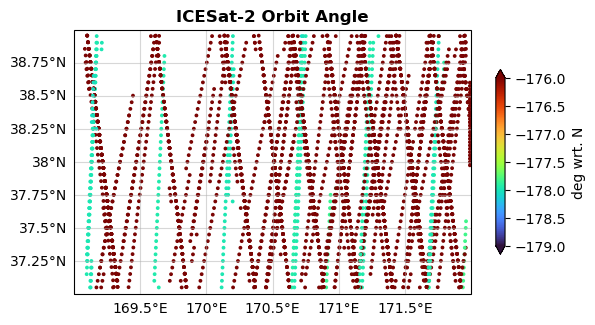

In [354]:
# Plot ICESat-2 ATL12 SSH

fig = plt.figure()
ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False

for r in atl12.keys():
    """
    for b in atl12[r].keys():
        if (b in list(atl12[r].keys())) == False:
            continue
        if ("yaw" in list(atl12[r][b].keys())) == False:
            continue
        if ((~np.isnan(atl12[r][b]["seg_ssh_ellip"])).sum()) == 0:
            continue
    """
        
    if ("gtx" in list(atl12[r].keys())) == False:
        continue
    b = "gtx"
    if ((~np.isnan(atl12[r][b]["yaw"])).sum()) == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"], atl12[r][b]["lat"], 3, atl12[r][b]["yaw"], cmap="turbo", vmin=-179, vmax=-176)


ax.set_title("ICESat-2 Orbit Angle", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
fig.colorbar(sc, label="deg wrt. N", orientation="vertical", shrink=0.5, pad=0.05, extend="both")
plt.show()

In [355]:
for r in atl12.keys():
    if ("gtx" in list(atl12[r].keys())) == False:
        continue
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    date = datetime.datetime(2018,1,1) + datetime.timedelta(seconds = np.nanmean(atl12[r][b]["time"]))
    #print("Anomaly: {:.0f} at date {}".format(np.nanmean(atl12[r][b]["yaw"])<-177, date) )

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\764950019.py:4: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:


C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\2149607367.py:8: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\2149607367.py:21: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])<-90:


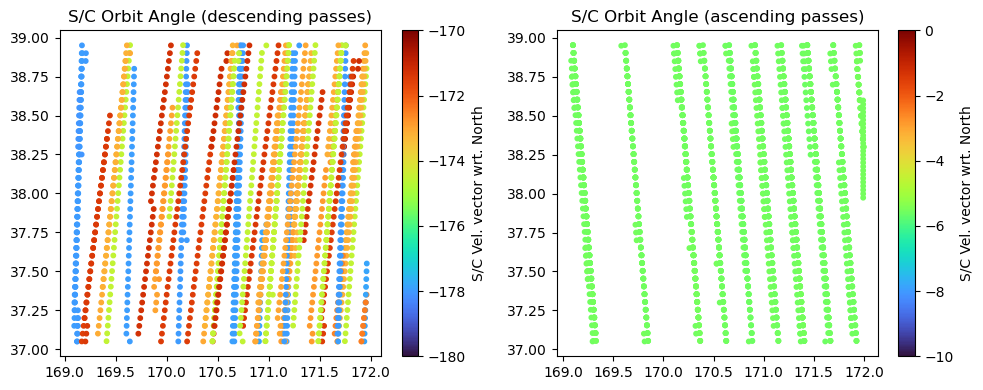

In [356]:
fig = plt.figure(figsize=(10,4))

ax = fig.add_subplot(1,2,1)
for r in atl12.keys():
    if ("gtx" in list(atl12[r].keys())) == False:
        continue
    b = "gtx"
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["yaw"], cmap="turbo", vmin=-180, vmax=-170)
plt.colorbar(sc,label="S/C Vel. vector wrt. North")
ax.set_title("S/C Orbit Angle (descending passes)")

ax = fig.add_subplot(1,2,2)
for r in atl12.keys():
    if ("gtx" in list(atl12[r].keys())) == False:
        continue
    b = "gtx"
    if np.nanmean(atl12[r][b]["yaw"])<-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["yaw"], cmap="turbo", vmin=-10, vmax=0)
plt.colorbar(sc,label="S/C Vel. vector wrt. North")
ax.set_title("S/C Orbit Angle (ascending passes)")

plt.tight_layout()
plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\280412232.py:10: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\280412232.py:26: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])<-90:


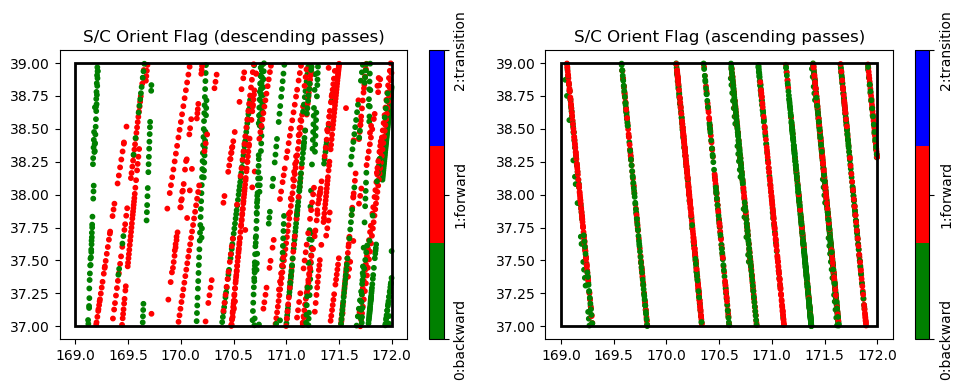

In [357]:
fig = plt.figure(figsize=(10,4))
from matplotlib.colors import ListedColormap
cmp = ListedColormap(['green', 'red', "blue"])

ax = fig.add_subplot(1,2,1)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,np.repeat(atl12[r][b]["sc_orient"],atl12[r][b]["lat"].size), cmap=cmp, vmin=0, vmax=2)
cb=plt.colorbar(sc, ticks=[0, 1, 2])
cb.ax.set_yticklabels(["0:backward", "1:forward", "2:transition"], rotation=90,verticalalignment='center')
ax.set_title("S/C Orient Flag (descending passes)")
from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='None'))

ax = fig.add_subplot(1,2,2)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])<-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,np.repeat(atl12[r][b]["sc_orient"],atl12[r][b]["lat"].size), cmap=cmp, vmin=0, vmax=2)
cb=plt.colorbar(sc, ticks=[0, 1, 2])
cb.ax.set_yticklabels(["0:backward", "1:forward", "2:transition"], rotation=90,verticalalignment='center')
ax.set_title("S/C Orient Flag (ascending passes)")
from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='None'))

plt.tight_layout()
plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\635462276.py:11: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\635462276.py:27: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])<-90:


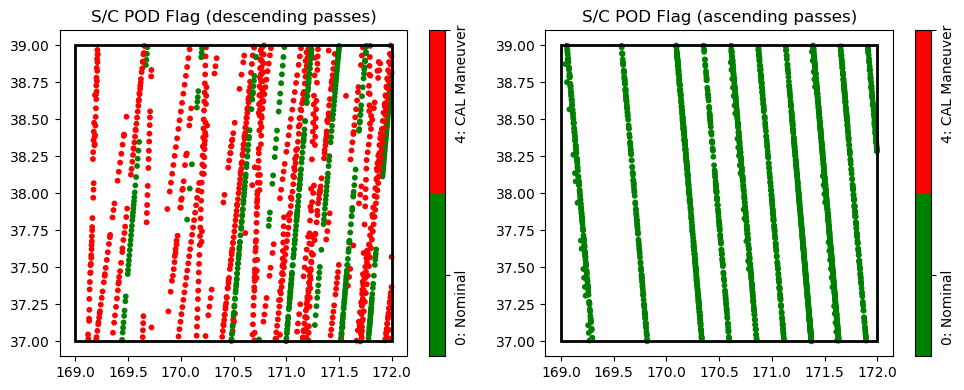

In [358]:
fig = plt.figure(figsize=(10,4))

from matplotlib.colors import ListedColormap
cmp = ListedColormap(['green', 'red'])

ax = fig.add_subplot(1,2,1)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["pod"].astype(float), cmap=cmp, vmin=0, vmax=4)
cb = plt.colorbar(sc, ticks=[1, 4])
cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("S/C POD Flag (descending passes)")
from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='None'))

ax = fig.add_subplot(1,2,2)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])<-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["pod"].astype(float), cmap=cmp, vmin=0, vmax=4)
cb = plt.colorbar(sc, ticks=[1, 4])
cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("S/C POD Flag (ascending passes)")

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='None'))

plt.tight_layout()
plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\3755609213.py:11: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\3755609213.py:27: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])<-90:


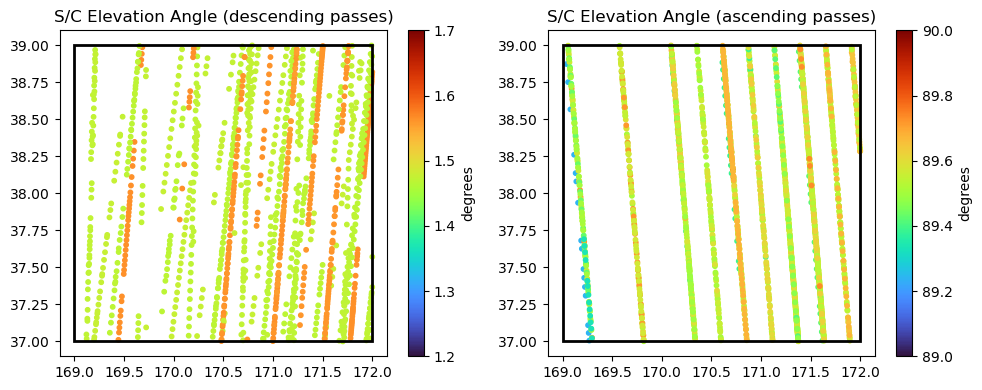

In [359]:
fig = plt.figure(figsize=(10,4))

from matplotlib.colors import ListedColormap
cmp = ListedColormap(['green', 'red'])

ax = fig.add_subplot(1,2,1)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["ref_elev"], cmap="turbo", vmin=1.2, vmax=1.7)
cb = plt.colorbar(sc, label="degrees")
#cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("S/C Elevation Angle (descending passes)")
from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='None'))

ax = fig.add_subplot(1,2,2)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])<-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,np.rad2deg(atl12[r][b]["ref_elev"]), cmap="turbo", vmin=89, vmax=90)
cb = plt.colorbar(sc, label="degrees")
#cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("S/C Elevation Angle (ascending passes)")

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='k', facecolor='None'))

plt.tight_layout()
plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\1975077255.py:11: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\1975077255.py:27: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])<-90:


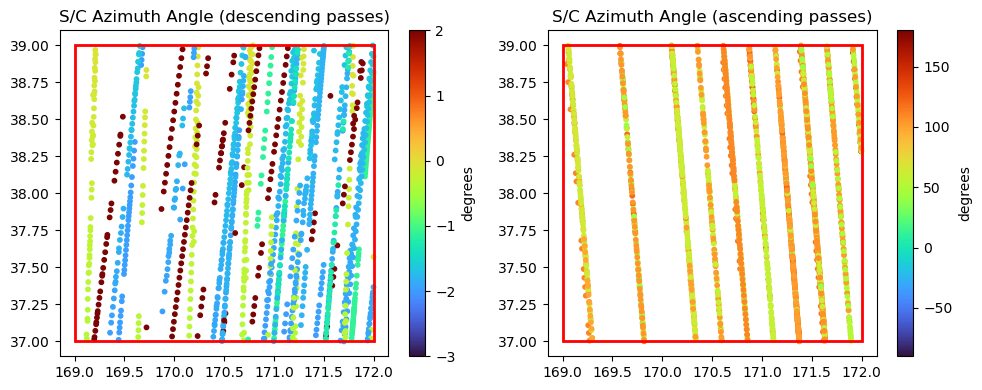

In [360]:
fig = plt.figure(figsize=(10,4))

from matplotlib.colors import ListedColormap
cmp = ListedColormap(['green', 'red'])

ax = fig.add_subplot(1,2,1)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["ref_azimuth"], cmap="turbo", vmin=-3, vmax=2)
cb = plt.colorbar(sc, label="degrees")
#cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("S/C Azimuth Angle (descending passes)")
from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='r', facecolor='None'))

ax = fig.add_subplot(1,2,2)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])<-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,np.rad2deg(atl12[r][b]["ref_azimuth"]), cmap="turbo", vmin=-90, vmax=180)
cb = plt.colorbar(sc, label="degrees")
#cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("S/C Azimuth Angle (ascending passes)")

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='r', facecolor='None'))

plt.tight_layout()
plt.show()

C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\4010836546.py:8: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])>-90:
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\4010836546.py:22: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[r][b]["yaw"])<-90:


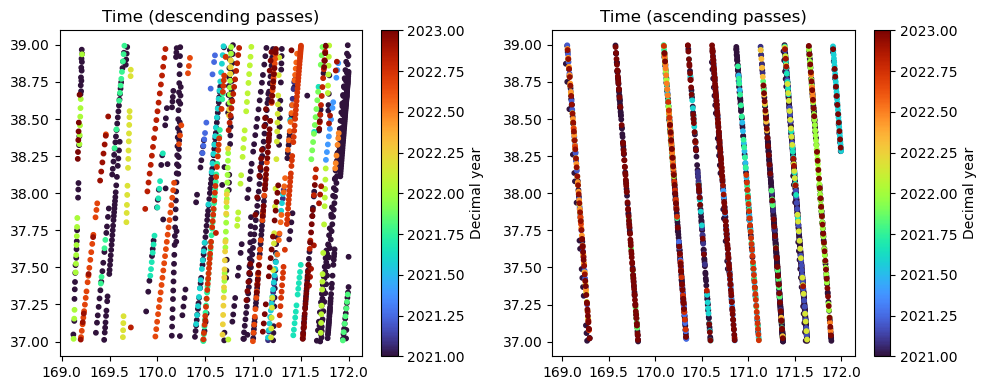

In [361]:
fig = plt.figure(figsize=(10,4))

ax = fig.add_subplot(1,2,1)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])>-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["time"]/(60*60*24*365.25)+2018, cmap="turbo", vmin=2021, vmax=2023)
cb = plt.colorbar(sc, label="Decimal year")
#cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("Time (descending passes)")

ax = fig.add_subplot(1,2,2)
for r in atl12.keys():
    if ("gt1" in list(atl12[r].keys())) == False:
        continue
    b = "gt1"
    if np.nanmean(atl12[r][b]["yaw"])<-90:
        continue
    if (~np.isnan(atl12[r][b]["yaw"])).sum() == 0:
        continue
    sc=ax.scatter(atl12[r][b]["lon"],atl12[r][b]["lat"],10,atl12[r][b]["time"]/(60*60*24*365.25)+2018, cmap="turbo", vmin=2021, vmax=2023)
cb = plt.colorbar(sc, label="Decimal year")
#cb.ax.set_yticklabels(["0: Nominal", "4: CAL Maneuver"], rotation=90)
ax.set_title("Time (ascending passes)")

plt.tight_layout()
plt.show()

In [388]:
# Stack data from same pass number
min_number_dataprtrack = 3#10
max_slope_val = 250

# Get keys from atl12
keys = list(atl12.keys())

# Get passes
passes = [i[:-2] for i in list(atl12.keys())]
passes.sort()
passes = np.unique(np.array(passes))

# Make new cycle key
atl12["pass"] = {}

# Loop over individual passes
for p in passes:
    if p == "pa":
        continue
    # Determine keys matching the pass
    matching_keys_mask = [(p in k) for k in keys]
    matching_keys = np.array(keys)[np.array(matching_keys_mask)]

    # For each cycle matching the pass ID and stack
    sss_x_stack = []
    sss_y_stack = []
    lat_stack = []
    lon_stack = []
    for m in matching_keys:

        # Remove at specific inclinations
        if np.nanmean(atl12[m]["gtx"]["yaw"]) < -175:
            continue

        # Remove not-nominal passes
        if np.nanmedian(atl12[m]["gt1"]["pod"]) != 0:
            continue

        sss_x = np.copy(atl12[m]["gtx"]["sss_x"])
        sss_x[abs(sss_x)>max_slope_val] = np.nan
        if (~np.isnan(sss_x)).sum() <= min_number_dataprtrack:
            sss_x[:] = np.nan
        sss_x_stack.append(sss_x)

        sss_y = np.copy(atl12[m]["gtx"]["sss_y"])
        sss_y[abs(sss_y)>max_slope_val] = np.nan
        if (~np.isnan(sss_y)).sum() <= min_number_dataprtrack:
            sss_y[:] = np.nan
        sss_y_stack.append(sss_y)
        
        lat_stack.append(atl12[m]["gtx"]["lat"])
        lon_stack.append(atl12[m]["gtx"]["lon"])
    sss_x_stack = np.array(sss_x_stack)
    sss_y_stack = np.array(sss_y_stack)
    lat_stack = np.array(lat_stack)
    lon_stack = np.array(lon_stack)

    # Check the std between longitudes of each pass
    sd = np.nanmean(np.nanstd(lon_stack,axis=0))
    
    if sd < 0.03:
        # Mean data
        sss_x_stack_mean = np.nanmean(sss_x_stack, axis=0)
        sss_y_stack_mean = np.nanmean(sss_y_stack, axis=0)
        lat_stack_mean = np.nanmean(lat_stack, axis=0)
        lon_stack_mean = np.nanmean(lon_stack, axis=0)
    else:
        # Concatinate data
        sss_x_stack_mean = sss_x_stack.reshape(-1)
        sss_y_stack_mean = sss_y_stack.reshape(-1)
        lat_stack_mean = lat_stack.reshape(-1)
        lon_stack_mean = lon_stack.reshape(-1)

    # Save data to new pass variable
    atl12["pass"][p] = {}
    atl12["pass"][p]["sss_x"] = sss_x_stack_mean
    atl12["pass"][p]["sss_y"] = sss_y_stack_mean
    atl12["pass"][p]["lat"] = lat_stack_mean
    atl12["pass"][p]["lon"] = lon_stack_mean

print("Number of passes used: {}".format(len(atl12["pass"].keys())))

Number of passes used: 20


c:\Users\bjark\anaconda3\envs\envMasterConda\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\117717975.py:63: RuntimeWarning: Mean of empty slice
  sss_x_stack_mean = np.nanmean(sss_x_stack, axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\117717975.py:64: RuntimeWarning: Mean of empty slice
  sss_y_stack_mean = np.nanmean(sss_y_stack, axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\117717975.py:66: RuntimeWarning: Mean of empty slice
  lon_stack_mean = np.nanmean(lon_stack, axis=0)
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\117717975.py:59: RuntimeWarning: Mean of empty slice
  sd = np.nanmean(np.nanstd(lon_stack,axis=0))
C:\Users\bjark\AppData\Local\Temp\ipykernel_20648\117717975.py:32: RuntimeWarning: Mean of empty slice
  if np.nanmean(atl12[m]["gtx"]["yaw"]) < -175:


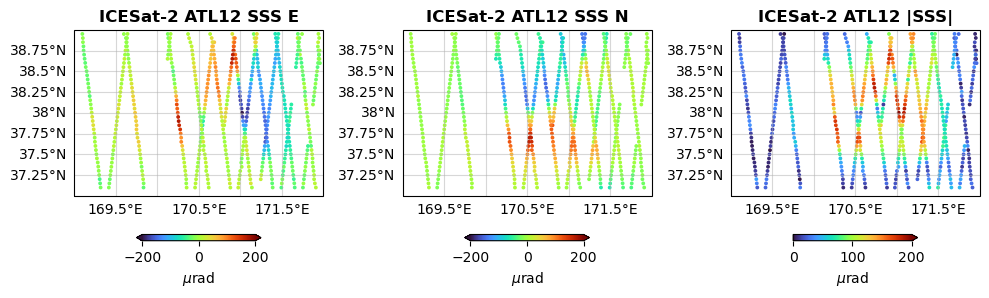

In [389]:
# Plot ICESat-2 ATL12 SSH

fig = plt.figure(figsize=(10,8))

ax = fig.add_subplot(1,3,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False


for p in atl12["pass"].keys():
    if (~np.isnan(atl12["pass"][p]["sss_x"])).sum() == 0:
        continue
    sc=ax.scatter(atl12["pass"][p]["lon"], atl12["pass"][p]["lat"], 3, atl12["pass"][p]["sss_x"], cmap="turbo", vmin=-200, vmax=200)


ax.set_title("ICESat-2 ATL12 SSS E", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
fig.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="both")


ax = fig.add_subplot(1,3,2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False

for p in atl12["pass"].keys():
    if (~np.isnan(atl12["pass"][p]["sss_y"])).sum() == 0:
        continue
    sc=ax.scatter(atl12["pass"][p]["lon"], atl12["pass"][p]["lat"], 3, atl12["pass"][p]["sss_y"], cmap="turbo", vmin=-200, vmax=200)


ax.set_title("ICESat-2 ATL12 SSS N", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
fig.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="both")



ax = fig.add_subplot(1,3,3, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False

for p in atl12["pass"].keys():
    if (~np.isnan(atl12["pass"][p]["sss_y"])).sum() == 0:
        continue
    mag = np.sqrt( (atl12["pass"][p]["sss_x"])**2 + (atl12["pass"][p]["sss_y"])**2 )
    sc=ax.scatter(atl12["pass"][p]["lon"], atl12["pass"][p]["lat"], 3, mag, cmap="turbo", vmin=0, vmax=200)


ax.set_title("ICESat-2 ATL12 |SSS|", fontweight="bold")
ax.set_extent(AOI, crs=ccrs.PlateCarree())
fig.colorbar(sc, label="$\mu$rad", orientation="horizontal", shrink=0.5, pad=0.05, extend="max")

plt.tight_layout()
plt.show()

Plotting Enabled

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'spherical' Variogram Model
Partial Sill: 5300
Full Sill: 5500
Range: 0.7
Nugget: 200 



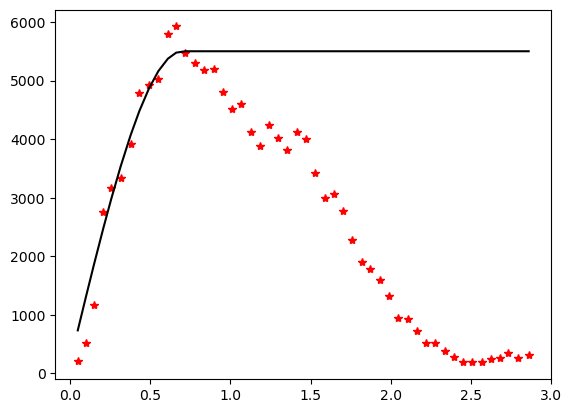

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

Plotting Enabled

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'spherical' Variogram Model
Partial Sill: 4800
Full Sill: 5000
Range: 1.0
Nugget: 200 



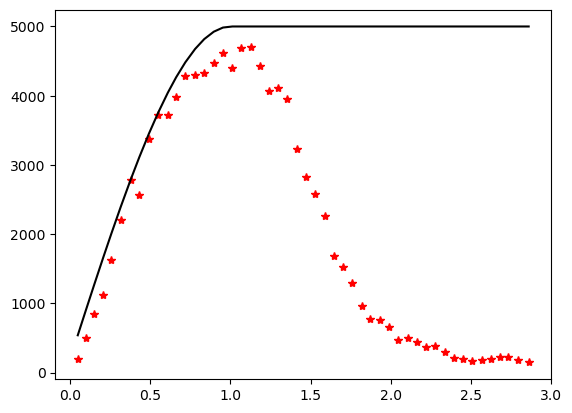

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

Plotting Enabled

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'spherical' Variogram Model
Partial Sill: 3300
Full Sill: 3500
Range: 1.2
Nugget: 200 



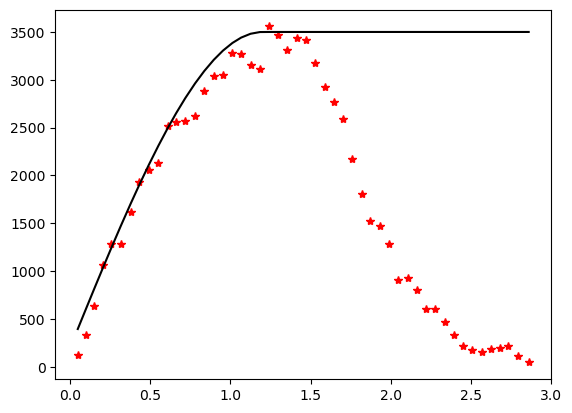

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



In [390]:
# Run kriging and grid ICESat-2 SSH, and plot

# For kriging
import pykrige.kriging_tools as kt
from pykrige.ok import OrdinaryKriging

# =======================================================================
# Gradient E
lons = np.array([])
lats = np.array([])
vals = np.array([])
for p in atl12["pass"].keys():
    lons = np.concatenate((lons, atl12["pass"][p]["lon"]))
    lats = np.concatenate((lats, atl12["pass"][p]["lat"]))
    vals = np.concatenate((vals, atl12["pass"][p]["sss_x"]))

mask = (~np.isnan(vals))
lons = lons[mask]
lats = lats[mask]
vals = vals[mask]

#N = 100
#lon_steps = np.linspace(AOI[0], AOI[1], N) # Longitude
#lat_steps = np.linspace(AOI[2], AOI[3], N) # Latitude
#grid_locs = np.meshgrid(lon_steps, lat_steps)

# variogram_parameters = {'sill': 5, 'range': 1, 'nugget': 0.1},
interp = OrdinaryKriging(lons,
                         lats,
                         vals,
                         variogram_model="spherical",
                         variogram_parameters = {'sill': 5500, 'range': 0.7, 'nugget': 200},
                         nlags=50,
                         verbose=True,
                         enable_plotting=True,
                         coordinates_type="geographic")

icesat_intp_x_grid, icesat_intp_x_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 200)
# =======================================================================


# =======================================================================
# Gradient N
lons = np.array([])
lats = np.array([])
vals = np.array([])
for p in atl12["pass"].keys():
    lons = np.concatenate((lons, atl12["pass"][p]["lon"]))
    lats = np.concatenate((lats, atl12["pass"][p]["lat"]))
    vals = np.concatenate((vals, atl12["pass"][p]["sss_y"]))

mask = (~np.isnan(vals))
lons = lons[mask]
lats = lats[mask]
vals = vals[mask]

interp = OrdinaryKriging(lons,
                         lats,
                         vals,
                         variogram_model="spherical",
                         variogram_parameters = {'sill': 5000, 'range': 1.0, 'nugget': 200},
                         nlags=50,
                         verbose=True,
                         enable_plotting=True,
                         coordinates_type="geographic")

icesat_intp_y_grid, icesat_intp_y_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 200)
# =======================================================================


# =======================================================================
# Gradient Magnitude
lons = np.array([])
lats = np.array([])
vals = np.array([])
for p in atl12["pass"].keys():
    lons = np.concatenate((lons, atl12["pass"][p]["lon"]))
    lats = np.concatenate((lats, atl12["pass"][p]["lat"]))
    mag = np.sqrt( (atl12["pass"][p]["sss_x"])**2 + (atl12["pass"][p]["sss_y"])**2 )
    vals = np.concatenate((vals, mag))

mask = (~np.isnan(vals))
lons = lons[mask]
lats = lats[mask]
vals = vals[mask]

interp = OrdinaryKriging(lons,
                         lats,
                         vals,
                         variogram_model="spherical",
                         variogram_parameters = {'sill': 3500, 'range': 1.2, 'nugget': 200},
                         nlags=50,
                         verbose=True,
                         enable_plotting=True,
                         coordinates_type="geographic")

icesat_intp_mag_grid, icesat_intp_mag_grid_var = interp.execute("grid", lon_steps, lat_steps, backend="C", n_closest_points = 200)
# =======================================================================




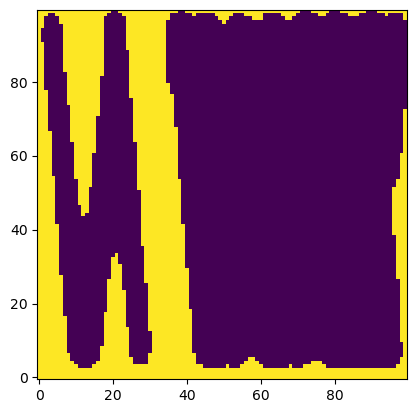

In [391]:
sd_max = 25
sd_mask = np.sqrt(icesat_intp_mag_grid_var) > sd_max
plt.imshow(sd_mask,origin="lower")

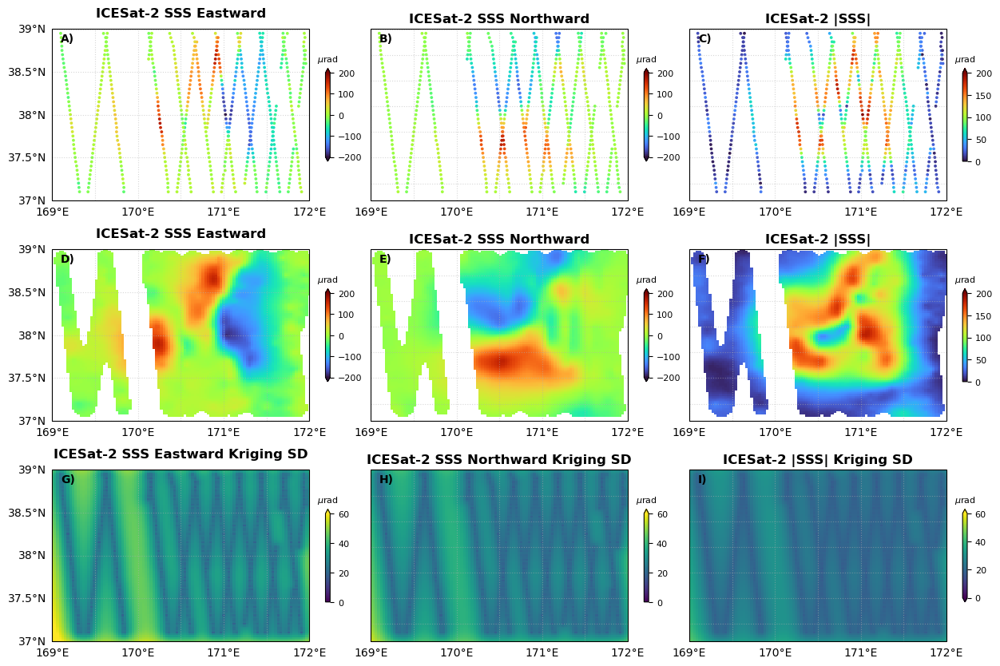

In [392]:
# Plot interpolated gradients

c = 5

fig = plt.figure(figsize=(12,8))

ax = fig.add_subplot(3,3,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

for p in atl12["pass"].keys():
    if (~np.isnan(atl12["pass"][p]["sss_x"])).sum() == 0:
        continue
    sc=ax.scatter(atl12["pass"][p]["lon"], atl12["pass"][p]["lat"], 3, atl12["pass"][p]["sss_x"], cmap="turbo", vmin=-200, vmax=200)

ax.set_title("ICESat-2 SSS Eastward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "A)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False


for p in atl12["pass"].keys():
    if (~np.isnan(atl12["pass"][p]["sss_y"])).sum() == 0:
        continue
    sc=ax.scatter(atl12["pass"][p]["lon"], atl12["pass"][p]["lat"], 3, atl12["pass"][p]["sss_y"], cmap="turbo", vmin=-200, vmax=200)

ax.set_title("ICESat-2 SSS Northward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "B)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,3, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

for p in atl12["pass"].keys():
    if (~np.isnan(atl12["pass"][p]["sss_x"])).sum() == 0:
        continue
    mag = np.sqrt( (atl12["pass"][p]["sss_x"])**2 + (atl12["pass"][p]["sss_y"])**2 )
    sc=ax.scatter(atl12["pass"][p]["lon"], atl12["pass"][p]["lat"], 3, mag, cmap="turbo", vmin=0, vmax=200)

ax.set_title("ICESat-2 |SSS|", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "C)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,4, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

x = np.copy(icesat_intp_x_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], x, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("ICESat-2 SSS Eastward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "D)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,5, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

x = np.copy(icesat_intp_y_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], x, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("ICESat-2 SSS Northward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "E)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,6, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

x = np.copy(icesat_intp_mag_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], x, cmap="turbo", vmin=0, vmax=200)

ax.set_title("ICESat-2 |SSS|", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "F)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,7, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], np.sqrt(icesat_intp_x_grid_var), cmap="viridis", vmin=0, vmax=60)

ax.set_title("ICESat-2 SSS Eastward Kriging SD", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "G)", fontweight="bold", transform=ccrs.PlateCarree())

ax = fig.add_subplot(3,3,8, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], np.sqrt(icesat_intp_y_grid_var), cmap="viridis", vmin=0, vmax=60)

ax.set_title("ICESat-2 SSS Northward Kriging SD", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "H)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,9, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], np.sqrt(icesat_intp_mag_grid_var), cmap="viridis", vmin=0, vmax=60)

ax.set_title("ICESat-2 |SSS| Kriging SD", fontweight="bold")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "I)", fontweight="bold", transform=ccrs.PlateCarree())

ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())

plt.tight_layout(pad=-2)
plt.show()

Mean diff x -5.69 urad
rms x 15.66 urad
corr x 0.97

Mean diff y 0.35 urad
rms y 11.28 urad
corr y 0.99

Mean diff mag 1.80 urad
rms mag 12.08 urad
corr mag 0.97


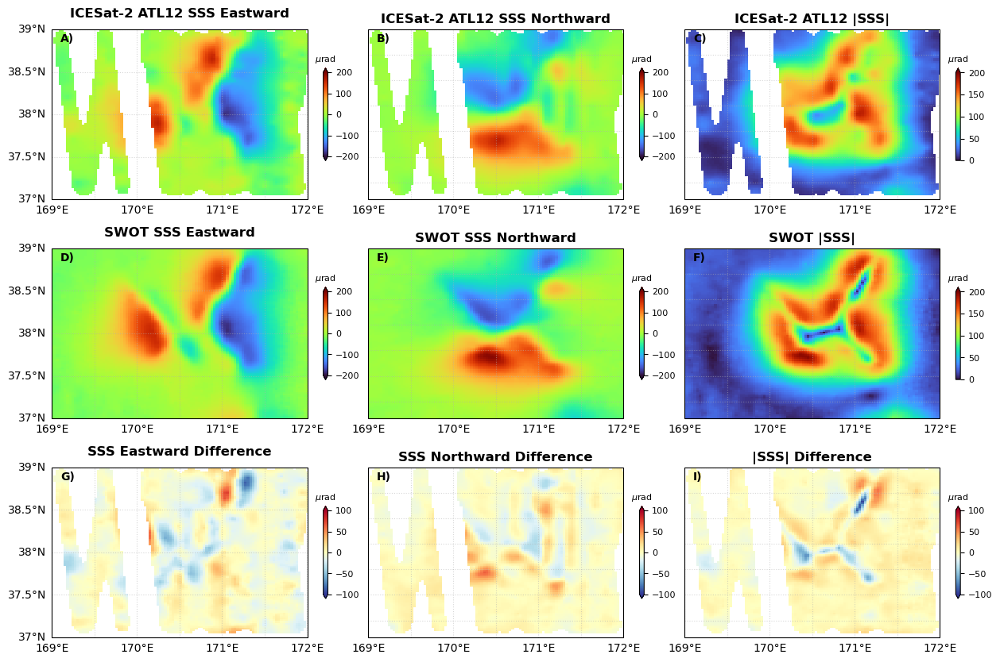

In [393]:
# Plot interpolated gradients

c = 5

fig = plt.figure(figsize=(12,8))

ax = fig.add_subplot(3,3,1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

x = np.copy(icesat_intp_x_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], x, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("ICESat-2 ATL12 SSS Eastward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "A)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

x = np.copy(icesat_intp_y_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], x, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("ICESat-2 ATL12 SSS Northward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "B)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,3, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

x = np.copy(icesat_intp_mag_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], x, cmap="turbo", vmin=0, vmax=200)

ax.set_title("ICESat-2 ATL12 |SSS|", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "C)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,4, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_x_grid, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("SWOT SSS Eastward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "D)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,5, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_y_grid, cmap="turbo", vmin=-200, vmax=200)

ax.set_title("SWOT SSS Northward", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "E)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,6, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

sc=ax.pcolormesh(grid_locs[0], grid_locs[1], np.sqrt(sss_x_grid**2 + sss_y_grid**2), cmap="turbo", vmin=0, vmax=200)

ax.set_title("SWOT |SSS|", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "F)", fontweight="bold", transform=ccrs.PlateCarree())


ax = fig.add_subplot(3,3,7, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
import matplotlib.ticker as mticker
gl.ylocator = mticker.FixedLocator([37, 37.5, 38, 38.5, 39])

x = np.copy(icesat_intp_x_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_x_grid - x, cmap="RdYlBu_r", vmin=-100, vmax=100)

ax.set_title("SSS Eastward Difference", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "G)", fontweight="bold", transform=ccrs.PlateCarree())
print("Mean diff x {:.2f} urad".format(np.nanmean(sss_x_grid - x)))
print("rms x {:.2f} urad".format( np.sqrt( np.nanmean( (sss_x_grid - x)**2 ) ) ))
nanmask = np.logical_and( (~np.isnan(sss_x_grid.reshape(-1))), (~np.isnan(x.reshape(-1))))
print("corr x {:.2f}".format( np.corrcoef(sss_x_grid.reshape(-1)[nanmask], x.reshape(-1)[nanmask])[1,0] ))

ax = fig.add_subplot(3,3,8, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

x = np.copy(icesat_intp_y_grid)
x[sd_mask] = np.nan
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], sss_y_grid - x, cmap="RdYlBu_r", vmin=-100, vmax=100)

ax.set_title("SSS Northward Difference", fontweight="bold")
ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "H)", fontweight="bold", transform=ccrs.PlateCarree())
print("")
print("Mean diff y {:.2f} urad".format(np.nanmean(sss_y_grid - x)))
print("rms y {:.2f} urad".format( np.sqrt( np.nanmean( (sss_y_grid - x)**2 ) ) ))
nanmask = np.logical_and( (~np.isnan(sss_y_grid.reshape(-1))), (~np.isnan(x.reshape(-1))))
print("corr y {:.2f}".format( np.corrcoef(sss_y_grid.reshape(-1)[nanmask], x.reshape(-1)[nanmask])[1,0] ))


ax = fig.add_subplot(3,3,9, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5,linestyle=":")
gl.top_labels = False
gl.right_labels = False
gl.left_labels = False

x = np.copy(icesat_intp_mag_grid)
x[sd_mask] = np.nan
mag_err = np.sqrt(sss_x_grid**2 + sss_y_grid**2) - x
sc=ax.pcolormesh(grid_locs[0], grid_locs[1], mag_err , cmap="RdYlBu_r", vmin=-100, vmax=100)

ax.set_title("|SSS| Difference", fontweight="bold")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.4, pad=0.05, extend="both")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)
ax.text(AOI[0]+0.1, AOI[3]-0.15, "I)", fontweight="bold", transform=ccrs.PlateCarree())
print("")
print("Mean diff mag {:.2f} urad".format(np.nanmean(mag_err)))
print("rms mag {:.2f} urad".format( np.sqrt( np.nanmean( (mag_err)**2 ) ) ))
nanmask = np.logical_and( (~np.isnan(np.sqrt(sss_x_grid**2 + sss_y_grid**2).reshape(-1))), (~np.isnan(x.reshape(-1))))
print("corr mag {:.2f}".format( np.corrcoef(np.sqrt(sss_x_grid**2 + sss_y_grid**2).reshape(-1)[nanmask],
                                            x.reshape(-1)[nanmask])[1,0] ))

ax.set_extent(AOI+np.array([-1,1,-1,1])*1e-3, crs=ccrs.PlateCarree())

plt.tight_layout(pad=-2)
plt.show()

Plotting Enabled

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'gaussian' Variogram Model
Partial Sill: 4300
Full Sill: 4500
Range: 0.9
Nugget: 200 



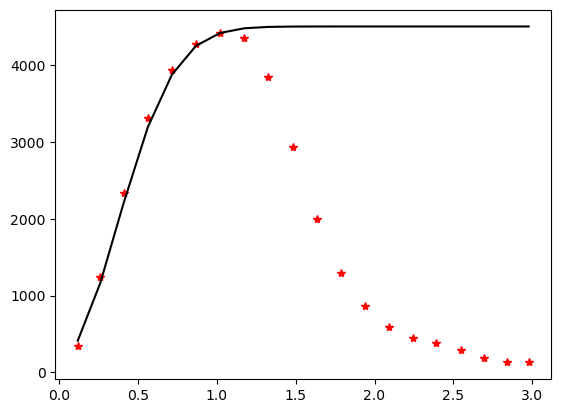

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

Plotting Enabled

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'gaussian' Variogram Model
Partial Sill: 3800
Full Sill: 4000
Range: 0.9
Nugget: 200 



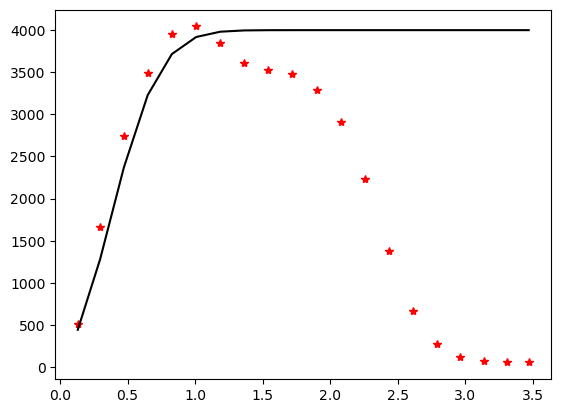

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



In [372]:
# Interpolate SWOT over to ICESat-2

# ICESat-2 locations
lons = np.array([])
lats = np.array([])
vals = np.array([])
iceE = np.array([])
iceN = np.array([])
for p in atl12["pass"].keys():
    lons = np.concatenate((lons, atl12["pass"][p]["lon"]))
    lats = np.concatenate((lats, atl12["pass"][p]["lat"]))
    iceE = np.concatenate((iceE, atl12["pass"][p]["sss_x"]))
    iceN = np.concatenate((iceN, atl12["pass"][p]["sss_y"]))
icesat_mask = ~np.isnan(iceE)
lats = lats[icesat_mask]
lons = lons[icesat_mask]
iceE = iceE[icesat_mask]
iceN = iceN[icesat_mask]


# ===========================================================
# Y axis
interp = OrdinaryKriging(grid_locs[0].reshape(-1),
                         grid_locs[1].reshape(-1),
                         sss_y_grid.reshape(-1),
                         variogram_model="gaussian",
                         variogram_parameters = {'sill': 4500, 'range': 0.9, 'nugget': 200},
                         nlags=20,
                         verbose=True,
                         enable_plotting=True,
                         coordinates_type="geographic")

swot2ice_grad_y_intp, swot2ice_grad_y_intp_var = interp.execute("points", lons, lats, backend="C", n_closest_points = 100)

# ===========================================================
# X axis

interp = OrdinaryKriging(grid_locs[0].reshape(-1),
                         grid_locs[1].reshape(-1),
                         sss_x_grid.reshape(-1),
                         variogram_model="gaussian",
                         variogram_parameters = {'sill': 4000, 'range': 0.9, 'nugget': 200},
                         nlags=20,
                         verbose=True,
                         enable_plotting=True)

swot2ice_grad_x_intp, swot2ice_grad_x_intp_var = interp.execute("points", lons, lats, backend="C", n_closest_points = 100)


SSS E:
Correlation: 0.97
MAD: 11.92 urad
Difference: -5.40 urad
RMS: 15.99 urad

SSS N:
Correlation: 0.97
MAD: 9.80 urad
Difference: -0.05 urad
RMS: 13.08 urad

SSS Mag:
Correlation: 0.98
MAD: 7.57 urad
Difference: 0.44 urad
RMS: 10.30 urad


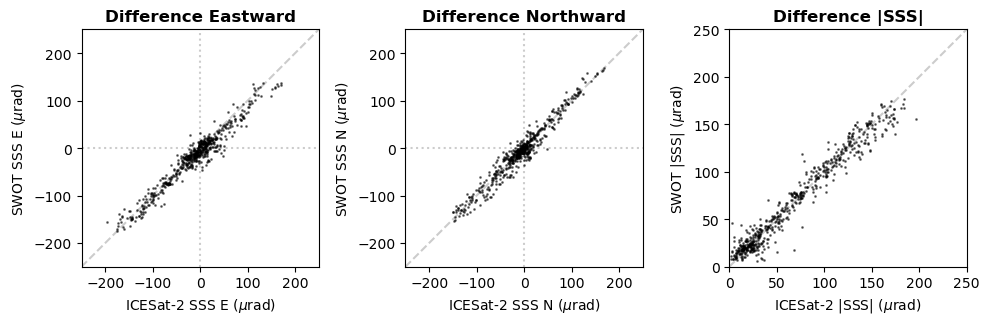

In [374]:
fig = plt.figure(figsize=(10,5))
ICESAT_E = iceE
ICESAT_N = iceN
SWOT_E = swot2ice_grad_x_intp
SWOT_N = swot2ice_grad_y_intp

# =====================================
ax = fig.add_subplot(1,3,1)

ax.axhline(0, linestyle=':', color='k', alpha=0.2) # horizontal lines
ax.axvline(0, linestyle=':', color='k', alpha=0.2) # vertical lines
ax.plot(np.array([-1,1])*250, np.array([-1,1])*250, linestyle='--', color='k', alpha=0.2) # 1:1 line

ax.scatter(ICESAT_E, SWOT_E, 1, "k", alpha=0.5)
ax.set_xlim([-250, 250])
ax.set_ylim([-250, 250])
ax.set_xlabel(r"ICESat-2 SSS E ($\mu $rad)")
ax.set_ylabel(r"SWOT SSS E ($\mu $rad)")
ax.set_title("Difference Eastward", fontweight="bold")
ax.set_aspect(1)

print("\nSSS E:")
corr = np.corrcoef(ICESAT_E.reshape(-1), SWOT_E.reshape(-1))[0,1]
print("Correlation: {:.2f}".format(corr))
MAD = np.mean(abs(ICESAT_E - SWOT_E))
print("MAD: {:.2f} urad".format(MAD))
diff = np.mean(SWOT_E - ICESAT_E)
print("Difference: {:.2f} urad".format(diff))
RMS = np.sqrt(np.mean((ICESAT_E - SWOT_E)**2))
print("RMS: {:.2f} urad".format(RMS))

# =====================================
ax = fig.add_subplot(1,3,2)

ax.axhline(0, linestyle=':', color='k', alpha=0.2) # horizontal lines
ax.axvline(0, linestyle=':', color='k', alpha=0.2) # vertical lines
ax.plot(np.array([-1,1])*250, np.array([-1,1])*250, linestyle='--', color='k', alpha=0.2) # 1:1 line

ax.scatter(ICESAT_N, SWOT_N, 1, "k", alpha=0.5)

ax.set_xlim([-250, 250])
ax.set_ylim([-250, 250])
ax.set_xlabel(r"ICESat-2 SSS N ($\mu $rad)")
ax.set_ylabel(r"SWOT SSS N ($\mu $rad)")
ax.set_title("Difference Northward", fontweight="bold")
ax.set_aspect(1)

print("\nSSS N:")
corr = np.corrcoef(ICESAT_N.reshape(-1), SWOT_N.reshape(-1))[0,1]
print("Correlation: {:.2f}".format(corr))
MAD = np.mean(abs(ICESAT_N - SWOT_N))
print("MAD: {:.2f} urad".format(MAD))
diff = np.mean(SWOT_N - ICESAT_N)
print("Difference: {:.2f} urad".format(diff))
RMS = np.sqrt(np.mean((ICESAT_N - SWOT_N)**2))
print("RMS: {:.2f} urad".format(RMS))

# =====================================
ax = fig.add_subplot(1,3,3)

ax.plot(np.array([0,1])*250, np.array([0,1])*250, linestyle='--', color='k', alpha=0.2) # 1:1 line

mag_ICE = np.sqrt(ICESAT_N**2+ICESAT_E**2)
mag_SWOT = np.sqrt(SWOT_N**2+SWOT_E**2)
ax.scatter(mag_ICE, mag_SWOT, 1, "k", alpha=0.5)

ax.set_xlim([0, 250])
ax.set_ylim([0, 250])
ax.set_xlabel(r"ICESat-2 |SSS| ($\mu $rad)")
ax.set_ylabel(r"SWOT |SSS| ($\mu $rad)")
ax.set_title("Difference |SSS|", fontweight="bold")
ax.set_aspect(1)

#ax.text(20, 240, "C)", fontweight="bold")

print("\nSSS Mag:")
corr = np.corrcoef(mag_ICE.reshape(-1), mag_SWOT.reshape(-1))[0,1]
print("Correlation: {:.2f}".format(corr))
MAD = np.mean(abs(mag_ICE - mag_SWOT))
print("MAD: {:.2f} urad".format(MAD))
diff = np.mean(mag_SWOT - mag_ICE)
print("Difference: {:.2f} urad".format(diff))
RMS = np.sqrt(np.mean((mag_ICE - mag_SWOT)**2))
print("RMS: {:.2f} urad".format(RMS))

plt.tight_layout()
plt.show()

Plotting Enabled

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'gaussian' Variogram Model
Partial Sill: 4800
Full Sill: 5000
Range: 0.9
Nugget: 200 



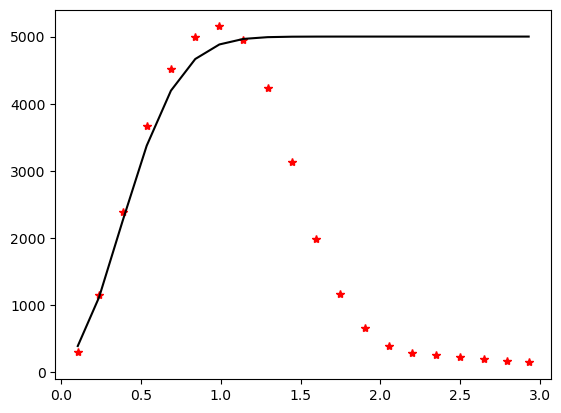

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

Plotting Enabled

Adjusting data for anisotropy...
Initializing variogram model...
Coordinates type: 'euclidean' 

Using 'gaussian' Variogram Model
Partial Sill: 3300
Full Sill: 3500
Range: 0.8
Nugget: 200 



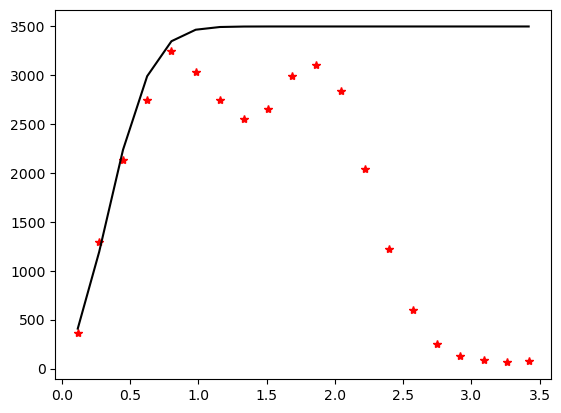

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



In [335]:
# Interpolate SWOT over to ICESat-2

# ICESat-2 locations
lons = np.array([])
lats = np.array([])
vals = np.array([])
iceE = np.array([])
iceN = np.array([])
for p in atl12["pass"].keys():
    lons = np.concatenate((lons, atl12["pass"][p]["lon"]))
    lats = np.concatenate((lats, atl12["pass"][p]["lat"]))
    iceE = np.concatenate((iceE, atl12["pass"][p]["sss_x"]))
    iceN = np.concatenate((iceN, atl12["pass"][p]["sss_y"]))
icesat_mask = ~np.isnan(iceE)
lats = lats[icesat_mask]
lons = lons[icesat_mask]
iceE = iceE[icesat_mask]
iceN = iceN[icesat_mask]


decimate = 2
# ===========================================================
# Y axis
points_swot = np.array([[],[]]).T
values_swot = np.array([])
for p in karin2[c].keys():
    points_ = np.c_[karin2[c][p]["ssh_ellip_full"]["lon"][::decimate,::decimate].reshape(-1), karin2[c][p]["ssh_ellip_full"]["lat"][::decimate,::decimate].reshape(-1)]
    values_ = karin2[c][p]["ssh_ellip_full"]["sss_y"][::decimate,::decimate].reshape(-1)# + bias[idx]
    mask = np.logical_and(points_[:,0]>AOI[0],points_[:,0]<AOI[1])
    mask = np.logical_and(mask,points_[:,1]>AOI[2])
    mask = np.logical_and(mask,points_[:,1]<AOI[3])
    mask = np.logical_and(mask,~np.isnan(values_))
    points_ = points_[mask,:]
    values_ = values_[mask]

    points_swot = np.r_[points_swot, points_]
    values_swot = np.r_[values_swot, values_]

interp = OrdinaryKriging(points_swot[:,0],
                         points_swot[:,1],
                         values_swot,
                         variogram_model="gaussian",
                         variogram_parameters = {'sill': 5000, 'range': 0.9, 'nugget': 200},
                         nlags=20,
                         verbose=True,
                         enable_plotting=True,
                         coordinates_type="geographic")

swot2ice_grad_y_intp, swot2ice_grad_y_intp_var = interp.execute("points", lons, lats, backend="C", n_closest_points = 100)

# ===========================================================
# X axis

points_swot = np.array([[],[]]).T
values_swot = np.array([])
for p in karin2[c].keys():
    points_ = np.c_[karin2[c][p]["ssh_ellip_full"]["lon"][::decimate,::decimate].reshape(-1), karin2[c][p]["ssh_ellip_full"]["lat"][::decimate,::decimate].reshape(-1)]
    values_ = karin2[c][p]["ssh_ellip_full"]["sss_x"][::decimate,::decimate].reshape(-1)# + bias[idx]
    mask = np.logical_and(points_[:,0]>AOI[0],points_[:,0]<AOI[1])
    mask = np.logical_and(mask,points_[:,1]>AOI[2])
    mask = np.logical_and(mask,points_[:,1]<AOI[3])
    mask = np.logical_and(mask,~np.isnan(values_))
    points_ = points_[mask,:]
    values_ = values_[mask]

    points_swot = np.r_[points_swot, points_]
    values_swot = np.r_[values_swot, values_]

interp = OrdinaryKriging(points_swot[:,0],
                         points_swot[:,1],
                         values_swot,
                         variogram_model="gaussian",
                         variogram_parameters = {'sill': 3500, 'range': 0.8, 'nugget': 200},
                         nlags=20,
                         verbose=True,
                         enable_plotting=True)

swot2ice_grad_x_intp, swot2ice_grad_x_intp_var = interp.execute("points", lons, lats, backend="C", n_closest_points = 100)


SSS E:
Correlation: 0.96
MAD: 13.21 urad
Difference: 4.48 urad
RMS: 19.02 urad

SSS N:
Correlation: 0.97
MAD: 9.91 urad
Difference: -0.18 urad
RMS: 13.45 urad

SSS Mag:
Correlation: 0.97
MAD: 8.78 urad
Difference: -1.24 urad
RMS: 12.81 urad


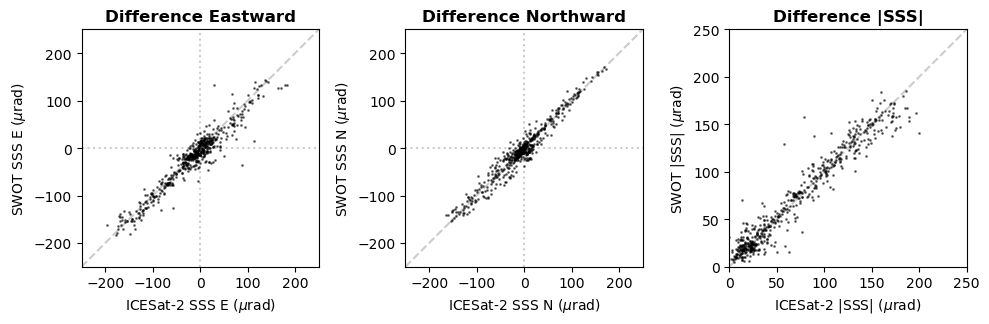

In [336]:
fig = plt.figure(figsize=(10,5))
ICESAT_E = iceE
ICESAT_N = iceN
SWOT_E = swot2ice_grad_x_intp
SWOT_N = swot2ice_grad_y_intp

# =====================================
ax = fig.add_subplot(1,3,1)

ax.axhline(0, linestyle=':', color='k', alpha=0.2) # horizontal lines
ax.axvline(0, linestyle=':', color='k', alpha=0.2) # vertical lines
ax.plot(np.array([-1,1])*250, np.array([-1,1])*250, linestyle='--', color='k', alpha=0.2) # 1:1 line

ax.scatter(ICESAT_E, SWOT_E, 1, "k", alpha=0.5)
ax.set_xlim([-250, 250])
ax.set_ylim([-250, 250])
ax.set_xlabel(r"ICESat-2 SSS E ($\mu $rad)")
ax.set_ylabel(r"SWOT SSS E ($\mu $rad)")
ax.set_title("Difference Eastward", fontweight="bold")
ax.set_aspect(1)

print("\nSSS E:")
corr = np.corrcoef(ICESAT_E.reshape(-1), SWOT_E.reshape(-1))[0,1]
print("Correlation: {:.2f}".format(corr))
MAD = np.mean(abs(ICESAT_E - SWOT_E))
print("MAD: {:.2f} urad".format(MAD))
diff = np.mean(ICESAT_E - SWOT_E)
print("Difference: {:.2f} urad".format(diff))
RMS = np.sqrt(np.mean((ICESAT_E - SWOT_E)**2))
print("RMS: {:.2f} urad".format(RMS))

# =====================================
ax = fig.add_subplot(1,3,2)

ax.axhline(0, linestyle=':', color='k', alpha=0.2) # horizontal lines
ax.axvline(0, linestyle=':', color='k', alpha=0.2) # vertical lines
ax.plot(np.array([-1,1])*250, np.array([-1,1])*250, linestyle='--', color='k', alpha=0.2) # 1:1 line

ax.scatter(ICESAT_N, SWOT_N, 1, "k", alpha=0.5)

ax.set_xlim([-250, 250])
ax.set_ylim([-250, 250])
ax.set_xlabel(r"ICESat-2 SSS N ($\mu $rad)")
ax.set_ylabel(r"SWOT SSS N ($\mu $rad)")
ax.set_title("Difference Northward", fontweight="bold")
ax.set_aspect(1)

print("\nSSS N:")
corr = np.corrcoef(ICESAT_N.reshape(-1), SWOT_N.reshape(-1))[0,1]
print("Correlation: {:.2f}".format(corr))
MAD = np.mean(abs(ICESAT_N - SWOT_N))
print("MAD: {:.2f} urad".format(MAD))
diff = np.mean(ICESAT_N - SWOT_N)
print("Difference: {:.2f} urad".format(diff))
RMS = np.sqrt(np.mean((ICESAT_N - SWOT_N)**2))
print("RMS: {:.2f} urad".format(RMS))

# =====================================
ax = fig.add_subplot(1,3,3)

ax.plot(np.array([0,1])*250, np.array([0,1])*250, linestyle='--', color='k', alpha=0.2) # 1:1 line

mag_ICE = np.sqrt(ICESAT_N**2+ICESAT_E**2)
mag_SWOT = np.sqrt(SWOT_N**2+SWOT_E**2)
ax.scatter(mag_ICE, mag_SWOT, 1, "k", alpha=0.5)

ax.set_xlim([0, 250])
ax.set_ylim([0, 250])
ax.set_xlabel(r"ICESat-2 |SSS| ($\mu $rad)")
ax.set_ylabel(r"SWOT |SSS| ($\mu $rad)")
ax.set_title("Difference |SSS|", fontweight="bold")
ax.set_aspect(1)

#ax.text(20, 240, "C)", fontweight="bold")

print("\nSSS Mag:")
corr = np.corrcoef(mag_ICE.reshape(-1), mag_SWOT.reshape(-1))[0,1]
print("Correlation: {:.2f}".format(corr))
MAD = np.mean(abs(mag_ICE - mag_SWOT))
print("MAD: {:.2f} urad".format(MAD))
diff = np.mean(mag_ICE - mag_SWOT)
print("Difference: {:.2f} urad".format(diff))
RMS = np.sqrt(np.mean((mag_ICE - mag_SWOT)**2))
print("RMS: {:.2f} urad".format(RMS))

plt.tight_layout()
plt.show()

# Simpson Seamount

In [ ]:
# Load and plot GEBCO23
EXTERNAL_DATA_PATH = "D:\MasterThesis\GEBCO\*w15*.nc"

data_path = glob.glob(EXTERNAL_DATA_PATH)
file = nc.Dataset(data_path[0], "r")
keys = file.variables.keys()
gebco = {}
for k in keys:
    gebco[k] = np.ma.getdata(file.variables[k][:])
gebco_extent = [gebco["lon"].min(), gebco["lon"].max(), gebco["lat"].min(), gebco["lat"].max()]

In [ ]:
AOI = gebco_extent

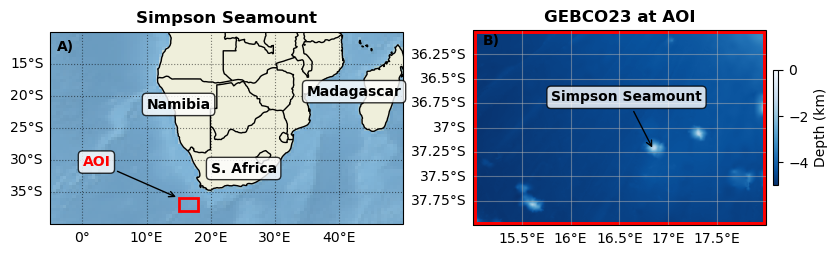

In [ ]:

fig = plt.figure(figsize=(10,5))

ax = fig.add_subplot(1, 2, 1, projection=ccrs.PlateCarree(central_longitude=0))
ax.coastlines(resolution='50m')
ax.add_feature(cartopy.feature.LAND, zorder=1)
ax.add_feature(cartopy.feature.BORDERS, zorder=2)
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5, color="k",linestyle=":")
gl.top_labels = False
gl.right_labels = False
ax.add_feature(cartopy.feature.LAND, zorder=0)
import matplotlib.ticker as mticker
#gl.xlocator = mticker.FixedLocator([i for i in range(120, 180, 20)]+[i for i in range(-180, -150, 20)])

ax.set_title("Simpson Seamount", fontweight="bold")

ax.stock_img()

from matplotlib.patches import Rectangle
ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=2, edgecolor='r', facecolor='None', transform=ccrs.PlateCarree()))

ax.set_extent([-5, 50, -40, -10], crs=ccrs.PlateCarree())

ax.annotate("S. Africa", (20, -32), (20, -32),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("Madagascar", (35, -20), (35, -20),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("Namibia", (10, -22), (10, -22),
            fontweight="bold", bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())
ax.annotate("AOI", (AOI[0], AOI[3]), (AOI[0]-15, AOI[2]+7),
            fontweight="bold", color="r", arrowprops=dict(facecolor='red',arrowstyle="->",edgecolor="k"),
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())

ax.text(-4, -13, "A)", fontweight="bold", transform=ccrs.PlateCarree())

ax = fig.add_subplot(1, 2, 2, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False
sc=ax.imshow(gebco["elevation"]/1e3, extent=gebco_extent, origin="lower", cmap="Blues_r", vmin=-5, vmax=0)
ax.set_title("GEBCO23 at AOI", fontweight="bold")
#ax.set_extent(AOI, crs=ccrs.PlateCarree())

ax.add_patch(Rectangle((AOI[0], AOI[2]), AOI[1]-AOI[0], AOI[3]-AOI[2], linewidth=5, edgecolor='r', facecolor='None', transform=ccrs.PlateCarree()))
plt.colorbar(sc, label="Depth (km)", shrink=0.3, pad=0.02)
ax.set_extent(AOI, crs=ccrs.PlateCarree())

ax.annotate("Simpson Seamount", (16.85, -37.23), (16.8-1, -37.23+0.5),
            fontweight="bold", color="k", arrowprops=dict(facecolor='k',arrowstyle="->",edgecolor="k"),
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8), transform=ccrs.PlateCarree())

ax.text(AOI[0]+0.1, AOI[3]-0.15, "B)", fontweight="bold", transform=ccrs.PlateCarree())

plt.show()

In [ ]:
# Load High Rate data
file_list = glob.glob("D:\MasterThesis\PreBetaKaRIn_HighRate\*_016_220L*_grid*")
print("N files:",len(file_list))

N files: 12


In [ ]:
# Load HR data
karin_hr = {}
for i_file, filename in enumerate(file_list):
    
    keys = ["lat", "lon", "ssh", "egm08"]
    data = np.load(filename)
    karin_hr[i_file] = {}
    for ik, k in enumerate(keys):
        karin_hr[i_file][k] = data[145:-145,250:-250,ik]

# Make all arrays same size # WARNING NOT SURE IF CORRECT ALIGNMENT
for k in karin_hr.keys():
    N, M = karin_hr[k]["ssh"].shape
    start_col = (M - 2200) // 2
    for k_ in karin_hr[k].keys():
        karin_hr[k][k_] = karin_hr[k][k_][:, start_col:start_col+2200]

In [ ]:
total_mean = np.mean([karin_hr[i]["ssh"].mean() for i in range(len(list(karin_hr.keys())))])
#total_mean = 0
#for k in karin.keys():
#    total_mean += np.nanmedian(karin[k]["ssh"])
#total_mean /= len(list(karin.keys()))
#total_mean

for k in karin_hr.keys():
    mean_diff = np.median(karin_hr[k]["ssh"]) - total_mean

    x = karin_hr[k]["ssh"]
    # Detrend
    x_idx = np.arange(x.shape[1])
    y = np.nanmean(x,axis=0)
    y_mean = np.nanmean(y)
    not_nan_ind = ~np.isnan(y)
    m, b, r_val, p_val, std_err = scipy.stats.linregress(x_idx[not_nan_ind],y[not_nan_ind]-y_mean)
    detrend_y = y - (m*x_idx + b)
    x = x - (m*x_idx + b)

    karin_hr[k]["ssh_detrend"] = x - mean_diff


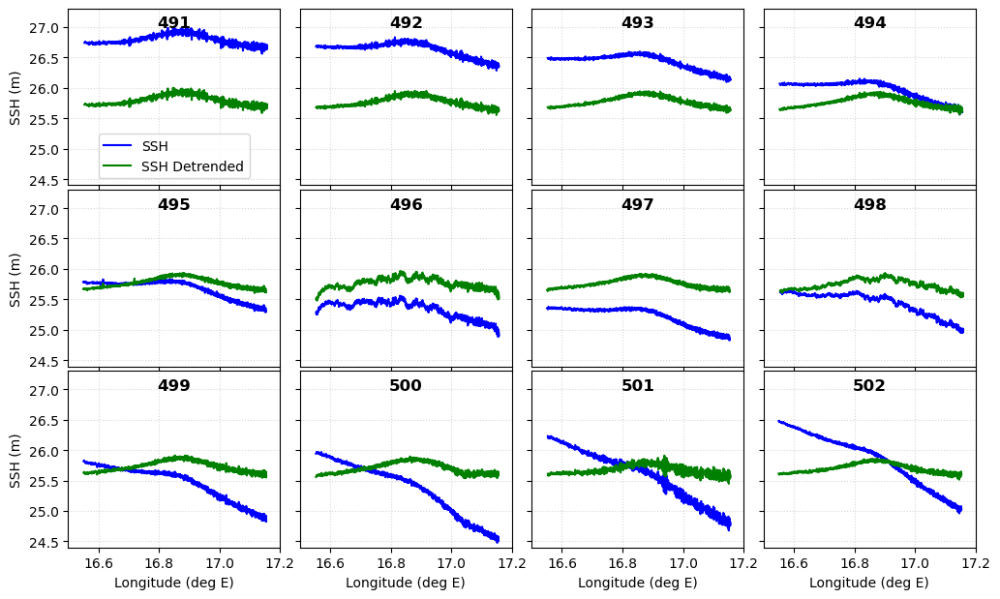

OBS! Mean profile


In [ ]:
fig = plt.figure(figsize=(10,6))
for k in karin_hr.keys():
    ax = fig.add_subplot(3,4,k+1)
    ax.plot(np.mean(karin_hr[k]["lon"],axis=0), np.mean(karin_hr[k]["ssh"],axis=0), "b")
    ax.plot(np.mean(karin_hr[k]["lon"],axis=0), np.mean(karin_hr[k]["ssh_detrend"],axis=0), "g")
    ax.set_title(k+491, fontweight="bold", y=1.0, pad=-14)
    ax.set_ylim([24.4, 27.3])
    ax.set_xlim([16.5, 17.2])
    ax.grid(which="both", linestyle=":", alpha=0.5)
    if k < 8:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel("Longitude (deg E)")
    if np.mod(k,4) != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("SSH (m)")
    if k == 0:
        plt.legend(["SSH", "SSH Detrended"], fontsize=10,loc="lower center")
plt.tight_layout(pad=0)
plt.show()
print("OBS! Mean profile")

C:\Users\bjark\AppData\Local\Temp\ipykernel_20584\2789205215.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


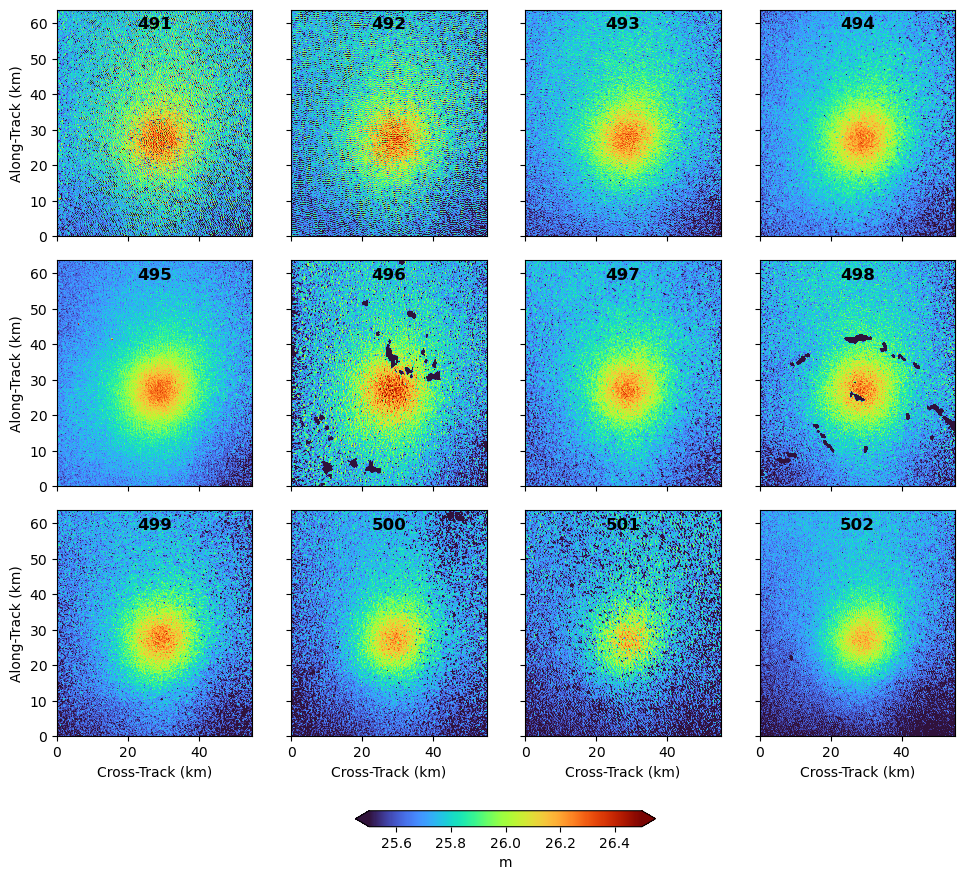

In [ ]:
fig = plt.figure(figsize=(10,8))
for k in karin_hr.keys():
    ax = fig.add_subplot(3,4,k+1)
    N, M = karin_hr[k]["ssh_detrend"].shape
    plotextent = [0, M*25/1000, 0, N*25/1000]
    sc=ax.imshow(karin_hr[k]["ssh_detrend"], extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.5, origin="lower")
    if k < 8:
        ax.set_xticklabels([])
    else:
        ax.set_xlabel("Cross-Track (km)")
    if np.mod(k,4) != 0:
        ax.set_yticklabels([])
    else:
        ax.set_ylabel("Along-Track (km)")
    ax.set_title(k+491, fontweight="bold", y=1.0,pad=-14)


cax = fig.add_axes([0.37, -0.04, 0.3, 0.02])  # [left, bottom, width, height]
cb = plt.colorbar(sc, cax=cax, orientation="horizontal", shrink=0.4, pad=0.5, extend="both")
cb.set_label('m')

plt.tight_layout()
plt.show()

In [ ]:
# Determine mean of all slices
lower_limit = 25
print("OBS: removing data lower than {} m".format(lower_limit))
ssh_mean_stack = np.zeros(karin_hr[0]["ssh_detrend"].shape)
for k in karin_hr.keys():
    ssh = np.copy(karin_hr[k]["ssh_detrend"])
    ssh[ssh<lower_limit] = np.nan
    ssh_mean_stack = np.dstack([ssh_mean_stack, ssh])
ssh_mean_stack = ssh_mean_stack[:,:,1:] # Remove first zero layer
ssh_mean = np.nanmean(ssh_mean_stack, axis=2)

print("mean sd before stacking: {:.2f} m".format(np.array([np.std(karin_hr[i]["ssh_detrend"]) for i in range(11)]).mean()))
print("sd after stacking: {:.2f} m".format(np.std(ssh_mean)))

OBS: removing data lower than 25 m
mean sd before stacking: 0.48 m
sd after stacking: 0.16 m


In [ ]:
## USE FFT SMOOTHED OR NOT
low_ssh_mean = np.copy(ssh_mean)
#X = np.copy(karin_hr[0]["ssh_detrend"])
filt_len_m = 5000
n_filt = filt_len_m//25
kern = np.outer(np.hanning(n_filt), np.hanning(n_filt))
kern /= kern.sum()
low_ssh_mean = scipy.signal.fftconvolve(low_ssh_mean, kern, mode="same")
low_ssh_mean = low_ssh_mean[n_filt//2:-n_filt//2, n_filt//2:-n_filt//2]


grad_c, grad_a = np.gradient(low_ssh_mean)
grad_c = (grad_c / 25)*1000*1000 # from grad pr cell to urad
grad_a = (grad_a / 25)*1000*1000 # from grad pr cell to urad


ssh_mean_2000 = np.copy(ssh_mean)
#X = np.copy(karin_hr[0]["ssh_detrend"])
filt_len_m_2000 = 2000
n_filt = filt_len_m_2000//25
kern = np.outer(np.hanning(n_filt), np.hanning(n_filt))
kern /= kern.sum()
ssh_mean_2000 = scipy.signal.fftconvolve(ssh_mean_2000, kern, mode="same")
ssh_mean_2000 = ssh_mean_2000[n_filt//2:-n_filt//2, n_filt//2:-n_filt//2]

grad_c_2000, grad_a_2000 = np.gradient(ssh_mean_2000)
grad_c_2000 = (grad_c_2000 / 25)*1000*1000 # from grad pr cell to urad
grad_a_2000 = (grad_a_2000 / 25)*1000*1000 # from grad pr cell to urad
grad_2000 = np.sqrt((grad_c_2000)**2+(grad_a_2000)**2)


ssh_mean_500 = np.copy(ssh_mean)
#X = np.copy(karin_hr[0]["ssh_detrend"])
filt_len_m_500 = 500
n_filt = filt_len_m_500//25
kern = np.outer(np.hanning(n_filt), np.hanning(n_filt))
kern /= kern.sum()
ssh_mean_500 = scipy.signal.fftconvolve(ssh_mean_500, kern, mode="same")
ssh_mean_500 = ssh_mean_500[n_filt//2:-n_filt//2, n_filt//2:-n_filt//2]

grad_c_500, grad_a_500 = np.gradient(ssh_mean_500)
grad_c_500 = (grad_c_500 / 25)*1000*1000 # from grad pr cell to urad
grad_a_500 = (grad_a_500 / 25)*1000*1000 # from grad pr cell to urad
grad_500 = np.sqrt((grad_c_500)**2+(grad_a_500)**2)

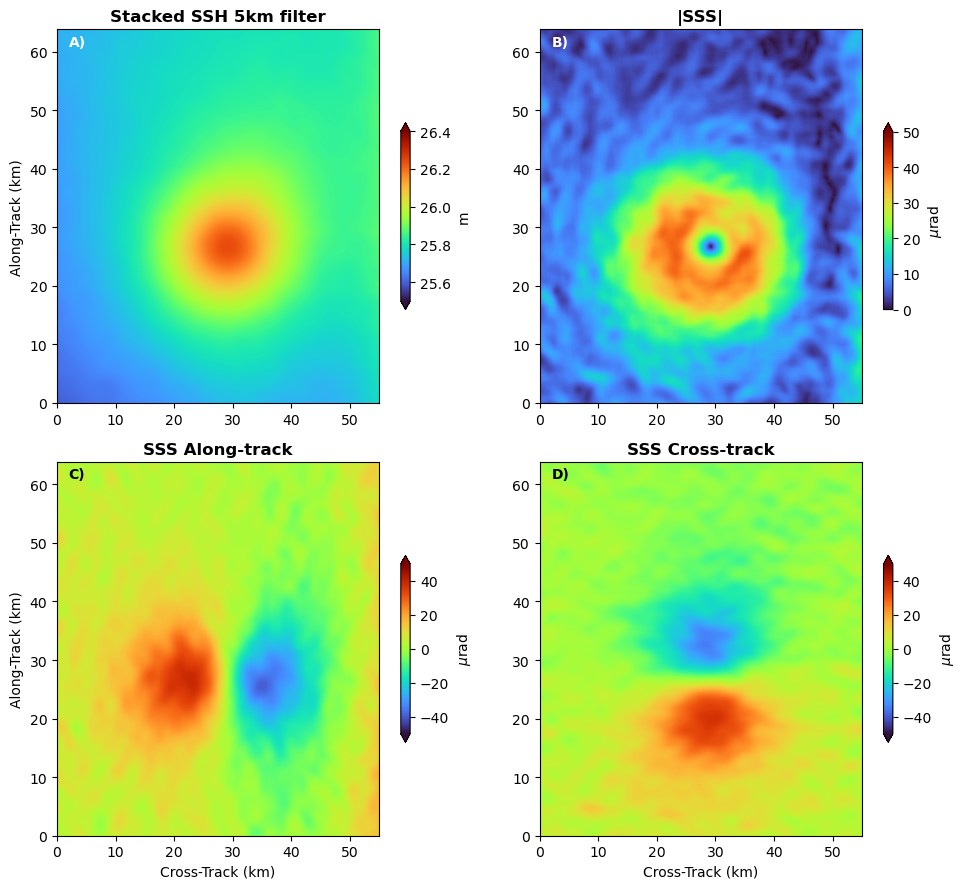

In [ ]:
# Show computed KaRIn Gradients

c = 5
fig = plt.figure(figsize=(10,9))

N, M = ssh_mean.shape
plotextent = [0, M*25/1000, 0, N*25/1000]

ax = fig.add_subplot(2,2,1)

sc=ax.imshow(low_ssh_mean, extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.4, origin="lower")
ax.set_title("Stacked SSH {:.0f}km filter".format(filt_len_m//1e3), fontweight="bold")
plt.colorbar(sc, label=r"m", orientation="vertical", shrink=0.5, pad=0.05, extend="both")
ax.set_ylabel("Along-Track (km)")
ax.text(2,61, "A)", fontweight="bold", color="w")

ax = fig.add_subplot(2,2,2)

sc=ax.imshow(np.sqrt((grad_a)**2+(grad_c)**2), extent=plotextent, cmap="turbo", vmin=0, vmax=50, origin="lower")
ax.set_title("|SSS|", fontweight="bold")
plt.colorbar(sc, label=r"$\mu$rad", orientation="vertical", shrink=0.5, pad=0.05, extend="max")
ax.text(2,61, "B)", fontweight="bold", color="w")

ax = fig.add_subplot(2,2,3)

sc=ax.imshow(grad_a, extent=plotextent, cmap="turbo", vmin=-50, vmax=50, origin="lower")
ax.set_title("SSS Along-track", fontweight="bold")
plt.colorbar(sc, label=r"$\mu$rad", orientation="vertical", shrink=0.5, pad=0.05, extend="both")
ax.set_ylabel("Along-Track (km)")
ax.set_xlabel("Cross-Track (km)")
ax.text(2,61, "C)", fontweight="bold", color="k")

ax = fig.add_subplot(2,2,4)

sc=ax.imshow(grad_c, extent=plotextent, cmap="turbo", vmin=-50, vmax=50, origin="lower")
ax.set_title("SSS Cross-track", fontweight="bold")
plt.colorbar(sc, label=r"$\mu$rad", orientation="vertical", shrink=0.5, pad=0.05, extend="both")
ax.set_xlabel("Cross-Track (km)")
ax.text(2,61, "D)", fontweight="bold", color="k")


plt.tight_layout()
plt.show()

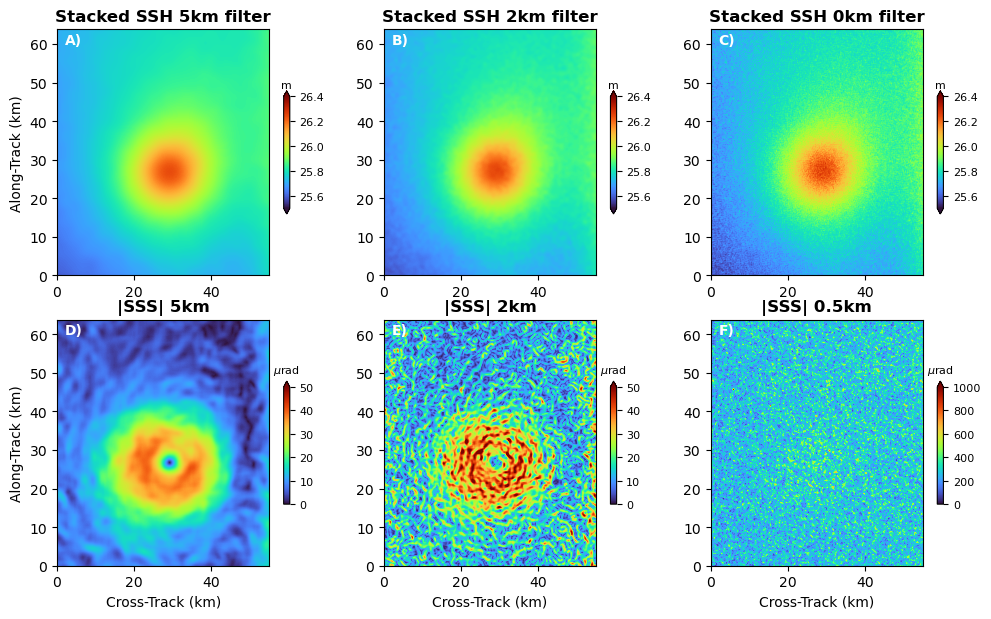

In [ ]:
# Show computed KaRIn Gradients

c = 5
fig = plt.figure(figsize=(10,6))

N, M = ssh_mean.shape
plotextent = [0, M*25/1000, 0, N*25/1000]

ax = fig.add_subplot(2,3,1)

sc=ax.imshow(low_ssh_mean, extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.4, origin="lower")
ax.set_title("Stacked SSH {:.0f}km filter".format(filt_len_m//1e3), fontweight="bold")
ax.set_ylabel("Along-Track (km)")
ax.text(2,60, "A)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title('m', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,2)

sc=ax.imshow(ssh_mean_2000, extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.4, origin="lower")
ax.set_title("Stacked SSH {:.0f}km filter".format(filt_len_m_2000//1e3), fontweight="bold")
ax.text(2,60, "B)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title('m', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,3)

sc=ax.imshow(ssh_mean_500, extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.4, origin="lower")
ax.set_title("Stacked SSH {:.0f}km filter".format(filt_len_m_500//1e3), fontweight="bold")
ax.text(2,60, "C)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title('m', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,4)

sc=ax.imshow(np.sqrt((grad_a)**2+(grad_c)**2), extent=plotextent, cmap="turbo", vmin=0, vmax=50, origin="lower")
ax.set_title("|SSS| 5km", fontweight="bold")
ax.text(2,60, "D)", fontweight="bold", color="w")
ax.set_ylabel("Along-Track (km)")
ax.set_xlabel("Cross-Track (km)")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,5)

sc=ax.imshow(np.sqrt((grad_a_2000)**2+(grad_c_2000)**2), extent=plotextent, cmap="turbo", vmin=0, vmax=50, origin="lower")
ax.set_title("|SSS| 2km", fontweight="bold")
ax.text(2,60, "E)", fontweight="bold", color="w")
ax.set_xlabel("Cross-Track (km)")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,6)

sc=ax.imshow(np.sqrt((grad_a_500)**2+(grad_c_500)**2), extent=plotextent, cmap="turbo", vmin=0, vmax=1000, origin="lower")
ax.set_title("|SSS| 0.5km", fontweight="bold")
ax.text(2,60, "F)", fontweight="bold", color="w")
ax.set_xlabel("Cross-Track (km)")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="max")
cb.ax.set_title('$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)


plt.tight_layout(pad=0)
plt.show()

Lambda 0.5 coherence: 29.40 km
Lambda 0.5 coherence: 13.64 km


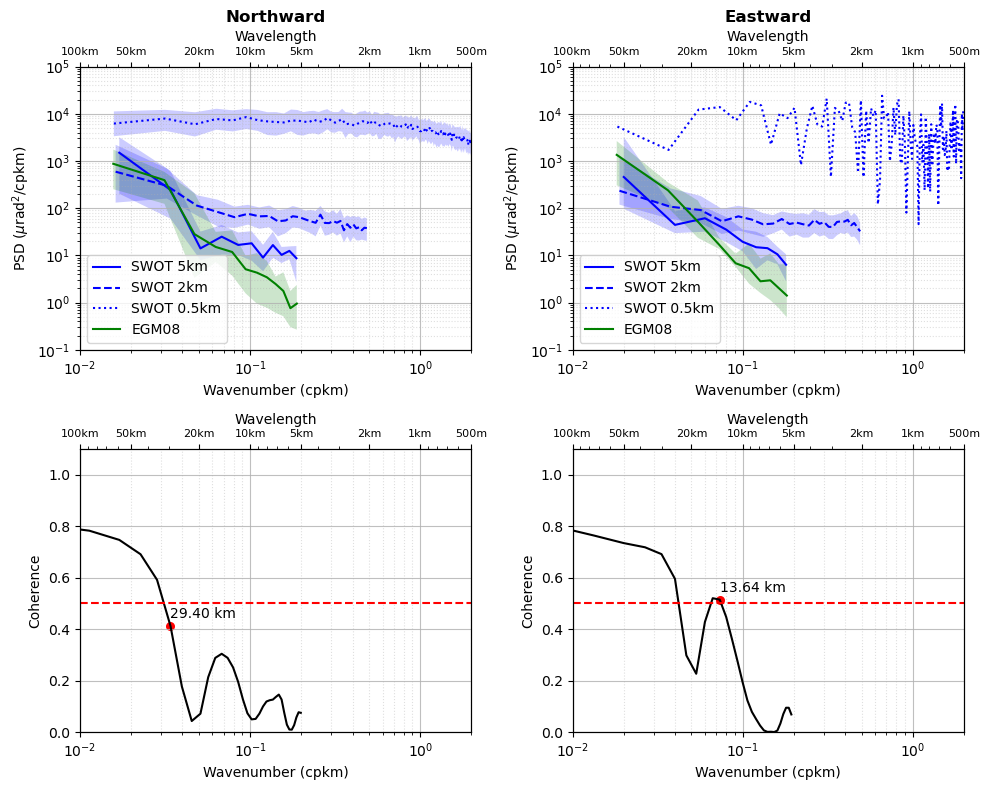

In [ ]:


fig = plt.figure(figsize=(10,8))

# =========================================================================================
ax = fig.add_subplot(2,2,1)
sampling_size = 25
grad = np.sqrt((grad_a)**2+(grad_c)**2)

# KaRIn PIXC along
ssh = []
for i in range(0,grad.shape[1],5):
    X = grad[:,i]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m/1e3]
sd = sd[:,k**(-1)>filt_len_m/1e3]
k = k[k**(-1)>filt_len_m/1e3]
ax.loglog(k, psd, 'blue')
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn PIXC along
ssh = []
for i in range(0,grad_2000.shape[1],5):
    X = grad_2000[:,i]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m_2000/1e3]
sd = sd[:,k**(-1)>filt_len_m_2000/1e3]
k = k[k**(-1)>filt_len_m_2000/1e3]
ax.loglog(k, psd, 'blue', linestyle="--")
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")


# KaRIn PIXC along
ssh = []
for i in range(0,grad_500.shape[1],5):
    X = grad_500[:,i]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m_500/1e3]
sd = sd[:,k**(-1)>filt_len_m_500/1e3]
k = k[k**(-1)>filt_len_m_500/1e3]
ax.loglog(k, psd, 'blue', linestyle=":")
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn EGM08 along
ssh = []
egm_grad_y, egm_grad_x = np.gradient(karin_hr[0]["egm08"])
egm_grad_y = (egm_grad_y / 25)*1000*1000 # from grad pr cell to urad
egm_grad_x = (egm_grad_x / 25)*1000*1000 # from grad pr cell to urad
egm_grad_mag = np.sqrt( (egm_grad_x)**2+(egm_grad_y)**2 )
for i in range(0,grad.shape[1],5):
    X = egm_grad_mag[:,i]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m/1e3]
sd = sd[:,k**(-1)>filt_len_m/1e3]
k = k[k**(-1)>filt_len_m/1e3]
ax.loglog(k, psd, 'g')
ax.fill_between(k, sd[0,:], sd[1,:], color='g',edgecolor=None, alpha=.2,label="_nolegend_")

ax.set_title("Northward", fontweight="bold")

ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel(r"PSD ($\mu$rad$^2$/cpkm)")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([1e-1, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

#ax.set_title("Right Swath")
plt.legend(["SWOT 5km", "SWOT 2km", "SWOT 0.5km", "EGM08"])

# Create second axis
ax.set_xlim([100**(-1), 0.5**(-1)])
ax2 = ax.twiny()
ax2.set_xscale("log")
ax2.set_xlabel("Wavelength")
ax2.set_xlim([100, 0.5])
ticks_km = [100, 50, 20, 10, 5, 2, 1]
ticks_m = [0.5]
ticks_loc = ticks_km + ticks_m
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_m = [str(int(t*1000))+"m" for t in ticks_m]
ticks_text = ticks_km + ticks_m

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)
# =========================================================================================


# =========================================================================================
ax = fig.add_subplot(2,2,2)
sampling_size = 25


# KaRIn PIXC cross
ssh = []
for j in range(0,grad_c.shape[0],5):
    X = grad[j,:]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m/1e3]
sd = sd[:,k**(-1)>filt_len_m/1e3]
k = k[k**(-1)>filt_len_m/1e3]
ax.loglog(k, psd, 'blue')
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn PIXC along
ssh = []
for j in range(0,grad_2000.shape[0],5):
    X = grad_2000[j,:]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m_2000/1e3]
sd = sd[:,k**(-1)>filt_len_m_2000/1e3]
k = k[k**(-1)>filt_len_m_2000/1e3]
ax.loglog(k, psd, 'blue', linestyle="--")
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")


# KaRIn PIXC along
ssh = []
for i in range(0,grad_500.shape[0],5):
    X = grad_500[j,:]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m_500/1e3]
sd = sd[:,k**(-1)>filt_len_m_500/1e3]
k = k[k**(-1)>filt_len_m_500/1e3]
ax.loglog(k, psd, 'blue', linestyle=":")
ax.fill_between(k, sd[0,:], sd[1,:], color='blue',edgecolor=None, alpha=.2,label="_nolegend_")

# KaRIn EGM08 cross
ssh = []
egm_grad_y, egm_grad_x = np.gradient(karin_hr[0]["egm08"])
egm_grad_y = (egm_grad_y / 25)*1000*1000 # from grad pr cell to urad
egm_grad_x = (egm_grad_x / 25)*1000*1000 # from grad pr cell to urad
egm_grad_mag = np.sqrt( (egm_grad_x)**2+(egm_grad_y)**2 )
for j in range(0,grad.shape[0],5):
    X = egm_grad_mag[j,:]
    ssh.append(X)
        
psd, k, sd = periodogram_list(ssh, conf_lvl=68, tapering_f="tukey", sampling=sampling_size, unit="m")
psd = psd[k**(-1)>filt_len_m/1e3]
sd = sd[:,k**(-1)>filt_len_m/1e3]
k = k[k**(-1)>filt_len_m/1e3]
ax.loglog(k, psd, 'g')
ax.fill_between(k, sd[0,:], sd[1,:], color='g',edgecolor=None, alpha=.2,label="_nolegend_")

ax.set_title("Eastward", fontweight="bold")


ax.set_yscale("log")
ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel(r"PSD ($\mu$rad$^2$/cpkm)")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([1e-1, 1e5])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

#ax.set_title("Right Swath")
plt.legend(["SWOT 5km", "SWOT 2km", "SWOT 0.5km", "EGM08"])

# Create second axis
ax.set_xlim([100**(-1), 0.5**(-1)])
ax2 = ax.twiny()
ax2.set_xscale("log")
ax2.set_xlabel("Wavelength")
ax2.set_xlim([100, 0.5])
ticks_km = [100, 50, 20, 10, 5, 2, 1]
ticks_m = [0.5]
ticks_loc = ticks_km + ticks_m
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_m = [str(int(t*1000))+"m" for t in ticks_m]
ticks_text = ticks_km + ticks_m

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)
# =========================================================================================


# =========================================================================================
ax = fig.add_subplot(2,2,3)
sampling_size = 25

# Coherence calcs
ssh_a = []
ssh_b = []
for i in range(0,grad.shape[1],5):
    X = grad[:,i]#np.sqrt(sss_x_grid[:,i]**2 + sss_y_grid[:,i]**2)
    ssh_a.append(X)
    X = egm_grad_mag[:,i]#np.sqrt(egm_sss_x_grid[:,i]**2 + egm_sss_y_grid[:,i]**2)
    ssh_b.append(X)

k = []
Pxy_list = []
for i in range(len(ssh_a)):
    k, Pxy = scipy.signal.csd(ssh_a[i], ssh_b[i], fs=(sampling_size/1e3)**(-1), nperseg=ssh_a[0].size, nfft=ssh_a[0].size*3)
    Pxy_list.append(Pxy)
Pxy = np.array(Pxy_list).mean(axis=0)
Pxy = Pxy[1:]

Pxx_list = []
for i in range(len(ssh_a)):
    k, Pxx = scipy.signal.csd(ssh_a[i], ssh_a[i], fs=(sampling_size/1e3)**(-1), nperseg=ssh_a[0].size, nfft=ssh_a[0].size*3)
    Pxx_list.append(Pxx)
Pxx = np.array(Pxx_list).mean(axis=0)
Pxx = Pxx[1:]

Pyy_list = []
for i in range(len(ssh_b)):
    k, Pyy = scipy.signal.csd(ssh_b[i], ssh_b[i], fs=(sampling_size/1e3)**(-1), nperseg=ssh_a[0].size, nfft=ssh_a[0].size*3)
    Pyy_list.append(Pyy)
Pyy = np.array(Pyy_list).mean(axis=0)
Pyy = Pyy[1:]
k = k[1:]

Cxy = abs(Pxy)**2 / (Pxx * Pyy) 
Cxy = Cxy[k**(-1)>filt_len_m/1e3]
k = k[k**(-1)>filt_len_m/1e3]
# https://en.wikipedia.org/wiki/Coherence_(signal_processing)

ax.plot(k, Cxy, 'k')

ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Coherence")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([0, 1.1])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

ax.hlines(0.5, 100**(-1), 0.5**(-1), linestyle="--", color="r")
argmin = np.argmin(abs(Cxy - 0.5))
print("Lambda 0.5 coherence: {:.2f} km".format(k[argmin]**(-1)))
ax.scatter(k[argmin], Cxy[argmin], 30, "r")
ax.text(k[argmin], Cxy[argmin]+0.03, "{:.2f} km".format(k[argmin]**(-1)))


# Create second axis
ax.set_xlim([100**(-1), 0.5**(-1)])
ax2 = ax.twiny()
ax2.set_xscale("log")
ax2.set_xlabel("Wavelength")
ax2.set_xlim([100, 0.5])
ticks_km = [100, 50, 20, 10, 5, 2, 1]
ticks_m = [0.5]
ticks_loc = ticks_km + ticks_m
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_m = [str(int(t*1000))+"m" for t in ticks_m]
ticks_text = ticks_km + ticks_m

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)


# =========================================================================================
ax = fig.add_subplot(2,2,4)

# Coherence calcs
ssh_a = []
ssh_b = []
for j in range(grad.shape[0]):
    X = grad[j,:]
    ssh_a.append(X)
    X = egm_grad_mag[j,:]
    ssh_b.append(X)

k = []
Pxy_list = []
for i in range(len(ssh_a)):
    k, Pxy = scipy.signal.csd(ssh_a[i], ssh_b[i], fs=(sampling_size/1e3)**(-1), nperseg=ssh_a[0].size, nfft=ssh_a[0].size*3)
    Pxy_list.append(Pxy)
Pxy = np.array(Pxy_list).mean(axis=0)
Pxy = Pxy[1:]

Pxx_list = []
for i in range(len(ssh_a)):
    k, Pxx = scipy.signal.csd(ssh_a[i], ssh_a[i], fs=(sampling_size/1e3)**(-1), nperseg=ssh_a[0].size, nfft=ssh_a[0].size*3)
    Pxx_list.append(Pxx)
Pxx = np.array(Pxx_list).mean(axis=0)
Pxx = Pxx[1:]

Pyy_list = []
for i in range(len(ssh_b)):
    k, Pyy = scipy.signal.csd(ssh_b[i], ssh_b[i], fs=(sampling_size/1e3)**(-1), nperseg=ssh_a[0].size, nfft=ssh_a[0].size*3)
    Pyy_list.append(Pyy)
Pyy = np.array(Pyy_list).mean(axis=0)
Pyy = Pyy[1:]
k = k[1:]

Cxy = abs(Pxy)**2 / (Pxx * Pyy) 
Cxy = Cxy[k**(-1)>filt_len_m/1e3]
k = k[k**(-1)>filt_len_m/1e3]
# https://en.wikipedia.org/wiki/Coherence_(signal_processing)

ax.plot(k, Cxy, 'k')

ax.set_xscale("log")
ax.set_xlabel("Wavenumber (cpkm)")
ax.set_ylabel("Coherence")
#ax.set_yticks(np.logspace(-5,6,12))
ax.set_ylim([0, 1.1])
ax.grid(which="major", alpha=0.8)
ax.grid(which="minor", alpha=0.4, linestyle=":")

ax.hlines(0.5, 100**(-1), 0.5**(-1), linestyle="--", color="r")
argmin = np.argmin(abs(Cxy - 0.5))
print("Lambda 0.5 coherence: {:.2f} km".format(k[argmin]**(-1)))
ax.scatter(k[argmin], Cxy[argmin], 30, "r")
ax.text(k[argmin], Cxy[argmin]+0.03, "{:.2f} km".format(k[argmin]**(-1)))

# Create second axis
ax.set_xlim([100**(-1), 0.5**(-1)])
ax2 = ax.twiny()
ax2.set_xscale("log")
ax2.set_xlabel("Wavelength")
ax2.set_xlim([100, 0.5])
ticks_km = [100, 50, 20, 10, 5, 2, 1]
ticks_m = [0.5]
ticks_loc = ticks_km + ticks_m
ticks_km = [str(t)+"km" for t in ticks_km]
ticks_m = [str(int(t*1000))+"m" for t in ticks_m]
ticks_text = ticks_km + ticks_m

ax2.set_xticks(ticks_loc)
ax2.set_xticklabels(ticks_text, fontsize=8)

plt.tight_layout()
plt.show()

In [ ]:
PATH = "C:\\Users\\bjark\\OneDrive - Danmarks Tekniske Universitet\\DTU\\02_Master\\Master Thesis\\*.all"
filename = glob.glob(PATH)[0]
keys = ["track","lat","lon","dummy","dh", "fejl",  "EGM08", "PEGM15"]
gm_file = np.loadtxt(filename)

gm = {}
for i, k in enumerate(keys):
    gm[k] = gm_file[:,i]

Plotting Enabled

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'gaussian' Variogram Model
Partial Sill: 0.0495
Full Sill: 0.05
Range: 0.4
Nugget: 0.0005 



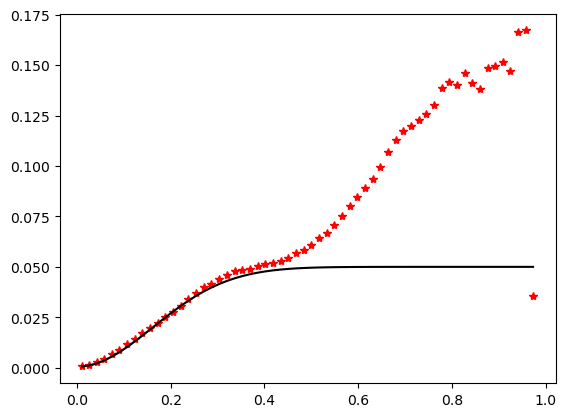

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

Executing Ordinary Kriging...



In [ ]:
# For kriging
import pykrige.kriging_tools as kt
from pykrige.ok import OrdinaryKriging

mask = np.logical_and(gm["lon"]>16.4, gm["lon"]<17.3)
mask = np.logical_and(mask, gm["lat"]>-37.6)
mask = np.logical_and(mask, gm["lat"]<-36.9)

# variogram_parameters = {'sill': 5, 'range': 1, 'nugget': 0.1},
interp = OrdinaryKriging(gm["lon"][mask],
                         gm["lat"][mask],
                         gm["dh"][mask]+gm["PEGM15"][mask],
                         variogram_model="gaussian",
                         variogram_parameters = {'sill': 0.05, 'range': 0.4, 'nugget': 0.0005},
                         nlags=60,
                         verbose=True,
                         enable_plotting=True,
                         coordinates_type="geographic")

# Entire grid
k = 0
gm_intp_grid_h, gm_intp_grid_h_var = interp.execute("points", karin_hr[k]["lon"][::20,::20].reshape(-1), karin_hr[k]["lat"][::20,::20].reshape(-1))
gm_intp_grid_h = gm_intp_grid_h.reshape(karin_hr[k]["lon"][::20,::20].shape)

# Points at profile
k = 0
gm_intp_h, gm_intp_h_var = interp.execute("points", karin_hr[k]["lon"][1100,:], karin_hr[k]["lat"][1100,:])
# =======================================================================
gm_intp_lon = karin_hr[k]["lon"][1100,:]
ssh_mean_profile = np.nanmean(ssh_mean[1100,:])

int_bias = gm_intp_h.mean() - np.nanmean(scipy.signal.detrend(ssh_mean[1100,:]) + ssh_mean_profile)

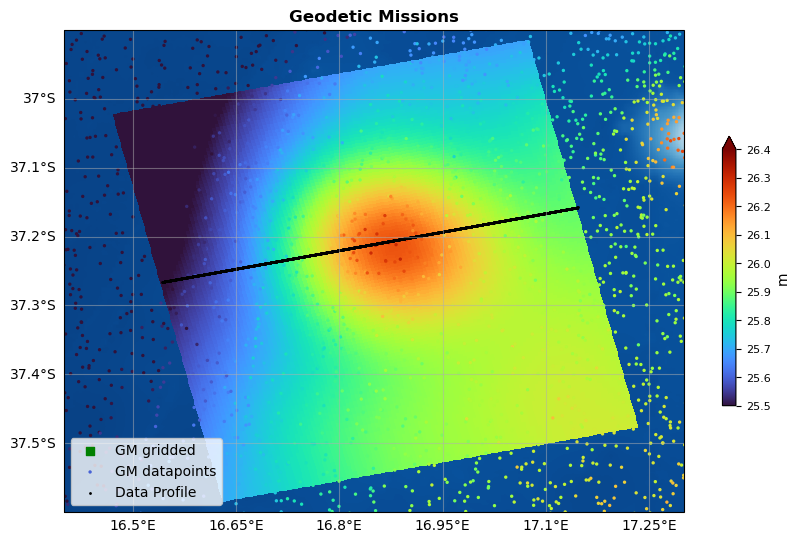

In [ ]:
fig = plt.figure(figsize=(10,7))

ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True, dms=False, x_inline=False, y_inline=False,alpha=0.5)
gl.top_labels = False
gl.right_labels = False
ax.imshow(gebco["elevation"]/1e3, extent=gebco_extent, origin="lower", cmap="Blues_r", vmin=-5, vmax=0)

sc=ax.pcolormesh(karin_hr[k]["lon"][::20,::20], karin_hr[k]["lat"][::20,::20], gm_intp_grid_h - int_bias, cmap="turbo", vmin=25.5, vmax=26.4)
ax.scatter([],[],40,"g","s")

ax.scatter(gm["lon"], gm["lat"], 2, gm["dh"]+gm["PEGM15"] - int_bias, cmap="turbo", vmin=25.5, vmax=26.4)

ax.scatter(karin_hr[k]["lon"][1100,:], karin_hr[k]["lat"][1100,:], 1, "k")

plt.legend(["GM gridded", "GM datapoints", "Data Profile"])

cb = plt.colorbar(sc, label="m", orientation="vertical", shrink=0.5, pad=0.05, extend="max")
cb.ax.tick_params(labelsize=8)
ax.set_title("Geodetic Missions", fontweight="bold")
ax.set_extent([16.4, 17.3, -36.9, -37.6], crs=ccrs.PlateCarree())
plt.show()

In [ ]:
# DEtrend GM data
x = gm_intp_grid_h - int_bias
# Detrend
x_idx = np.arange(x.shape[1])
y = np.nanmean(x,axis=0)
y_mean = np.nanmean(y)
not_nan_ind = ~np.isnan(y)
m, b, r_val, p_val, std_err = scipy.stats.linregress(x_idx[not_nan_ind],y[not_nan_ind]-y_mean)
detrend_y = y - (m*x_idx + b)
x = x - (m*x_idx + b)

# DEtrend GM data
x = x.T
# Detrend
x_idx = np.arange(x.shape[1])
y = np.nanmean(x,axis=0)
y_mean = np.nanmean(y)
not_nan_ind = ~np.isnan(y)
m, b, r_val, p_val, std_err = scipy.stats.linregress(x_idx[not_nan_ind],y[not_nan_ind]-y_mean)
detrend_y = y - (m*x_idx + b)
x = x - (m*x_idx + b)
x = x.T

gm_grid_detrend = x

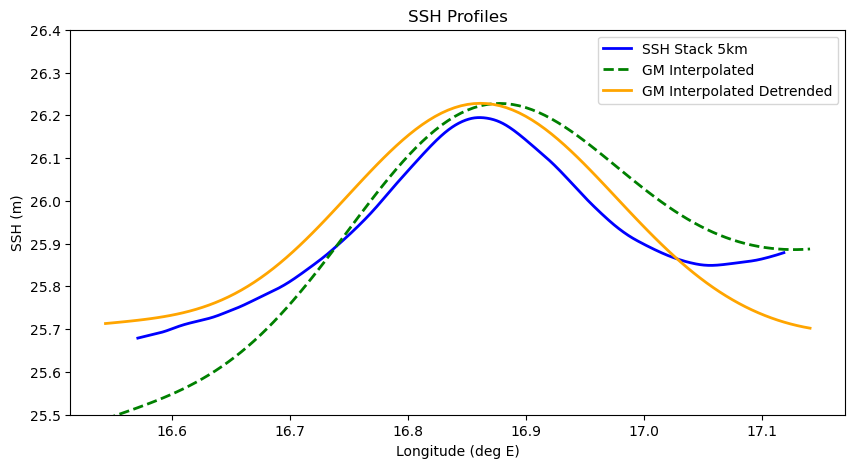

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1,1,1)
k = 0
#ax.plot(karin_hr[k]["lon"][1100,:], scipy.signal.detrend(ssh_mean[1100,:]) + ssh_mean_profile, "k", linewidth=1, linestyle=":", alpha=0.5)

#ax.plot(karin_hr[k]["lon"][1100,10:-10], scipy.signal.detrend(ssh_mean_500[1100,:]) + ssh_mean_profile, "k", linewidth=2, linestyle="--", alpha=0.5)

#ax.plot(karin_hr[k]["lon"][1100,40:-40], scipy.signal.detrend(ssh_mean_2000[1100,:]) + ssh_mean_profile, "k", linewidth=2, linestyle="-", alpha=1)
#ax.plot(karin_hr[k]["lon"][1100,40:-40], ssh_mean_2000[1100,:], "k", linewidth=2, linestyle="--", alpha=1)

#ax.plot(karin_hr[k]["lon"][1100,100:-100], scipy.signal.detrend(low_ssh_mean[1100,:]) + ssh_mean_profile, "g", linewidth=2, linestyle="-", alpha=1)

ax.plot(karin_hr[k]["lon"][1100,100:-100], low_ssh_mean[1100,:], "b", linewidth=2, linestyle="-", alpha=1)

#ax.plot(gm_intp_lon, gm_intp_h-int_bias, "b", linewidth=2)
ax.plot(karin_hr[k]["lon"][::20,::20][55,:], gm_intp_grid_h[55,:]-int_bias, "g", linewidth=2, linestyle="--")
#ax.fill_between(intp_lon, intp_h+int_bias-intp_h_var*3, intp_h+int_bias+intp_h_var*3, color='b',edgecolor=None, alpha=.2,label="_nolegend_")

tot_mean = np.mean(gm_intp_h-int_bias)
#ax.plot(gm_intp_lon, scipy.signal.detrend(gm_intp_h-int_bias)+tot_mean, "orange", linewidth=2)
ax.plot(karin_hr[k]["lon"][::20,::20][55,:], gm_grid_detrend[55,:], "orange", linewidth=2)
#ax.fill_between(intp_lon, (scipy.signal.detrend(intp_h+int_bias)+tot_mean)-intp_h_var*3, 
#                (scipy.signal.detrend(intp_h+int_bias)+tot_mean)+intp_h_var*3, color='orange',edgecolor=None, alpha=.2,label="_nolegend_")

ax.set_ylim([25.5, 26.4])
plt.legend(["SSH Stack 5km", "GM Interpolated", "GM Interpolated Detrended"])
ax.set_xlabel("Longitude (deg E)")
ax.set_ylabel("SSH (m)")
ax.set_title("SSH Profiles")
plt.show()

Mean diff: -2.73 cm
rms: 6.31 cm
Corr: 0.88

Mean diff: -1.30 urad
rms: 6.24 urad
Corr: 0.88


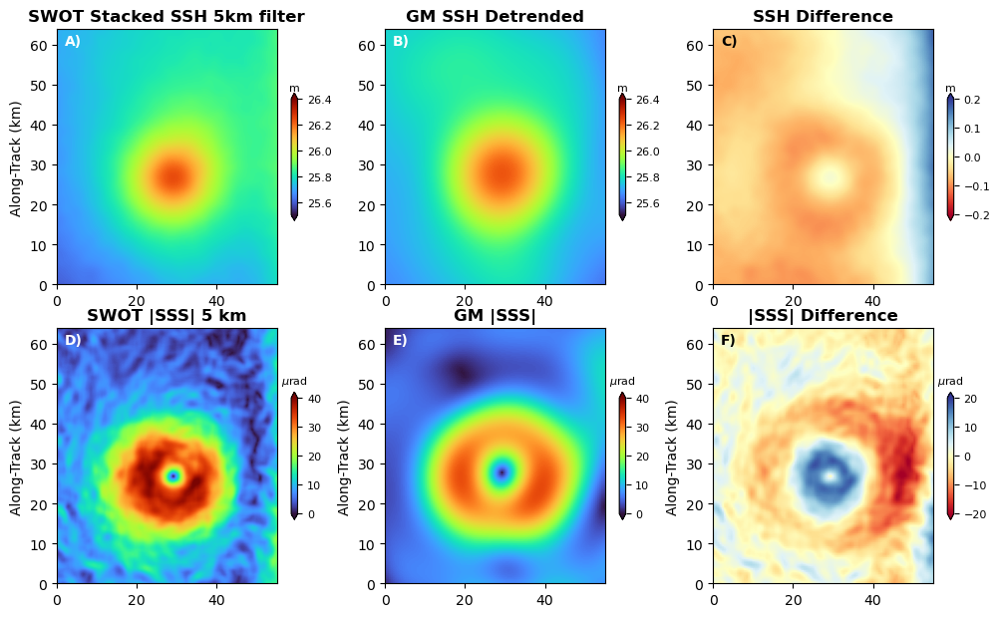

In [ ]:
# Show computed KaRIn Gradients

c = 5
fig = plt.figure(figsize=(10,6))

N, M = ssh_mean.shape
plotextent = [0, M*25/1000, 0, N*25/1000]

ax = fig.add_subplot(2,3,1)

sc=ax.imshow(low_ssh_mean, extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.4, origin="lower")
ax.set_title("SWOT Stacked SSH {:.0f}km filter".format(filt_len_m//1e3), fontweight="bold")
ax.set_ylabel("Along-Track (km)")
ax.text(2,60, "A)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title('m', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,2)

sc=ax.imshow(gm_grid_detrend, extent=plotextent, cmap="turbo", vmin=25.5, vmax=26.4, origin="lower")
ax.set_title("GM SSH Detrended".format(filt_len_m_2000//1e3), fontweight="bold")
ax.text(2,60, "B)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title('m', fontsize=8)
cb.ax.tick_params(labelsize=8)


ax = fig.add_subplot(2,3,3)


sc=ax.imshow(low_ssh_mean[::20,::20] - gm_grid_detrend[5:-5,5:-5], extent=plotextent, cmap="RdYlBu", origin="lower", vmin=-0.2, vmax=0.2)
ax.set_title("SSH Difference".format(filt_len_m_2000//1e3), fontweight="bold")
ax.text(2,60, "C)", fontweight="bold", color="k")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title('m', fontsize=8)
cb.ax.tick_params(labelsize=8)

print("Mean diff: {:.2f} cm".format(np.mean(low_ssh_mean[::20,::20] - gm_grid_detrend[5:-5,5:-5])*100))
print("rms: {:.2f} cm".format( np.sqrt(np.mean( (low_ssh_mean[::20,::20] - gm_grid_detrend[5:-5,5:-5])**2 ))*100) )
print("Corr: {:.2f}".format( np.corrcoef(low_ssh_mean[::20,::20].reshape(-1), gm_grid_detrend[5:-5,5:-5].reshape(-1))[1,0] ) )

ax = fig.add_subplot(2,3,4)

grad = np.gradient(low_ssh_mean)
grad = np.sqrt(grad[0]**2 + grad[1]**2)
grad = grad/25*1000*1000
sc=ax.imshow(grad, extent=plotextent, cmap="turbo", vmin=0, vmax=40, origin="lower")
ax.set_title("SWOT |SSS| 5 km".format(filt_len_m//1e3), fontweight="bold")
ax.set_ylabel("Along-Track (km)")
ax.text(2,60, "D)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title(r'$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,5)

grad_gm = np.gradient(gm_grid_detrend)
grad_gm = np.sqrt(grad_gm[0]**2 + grad_gm[1]**2)
grad_gm = grad_gm/25*1000*1000 / 20
sc=ax.imshow(grad_gm, extent=plotextent, cmap="turbo", vmin=0, vmax=40, origin="lower")
ax.set_title("GM |SSS|".format(filt_len_m//1e3), fontweight="bold")
ax.set_ylabel("Along-Track (km)")
ax.text(2,60, "E)", fontweight="bold", color="w")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title(r'$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)

ax = fig.add_subplot(2,3,6)

sc=ax.imshow(grad[::20,::20] - grad_gm[5:-5,5:-5], extent=plotextent, cmap="RdYlBu", vmin=-20, vmax=20, origin="lower")
ax.set_title("|SSS| Difference".format(filt_len_m//1e3), fontweight="bold")
ax.set_ylabel("Along-Track (km)")
ax.text(2,60, "F)", fontweight="bold", color="k")
cb = plt.colorbar(sc, orientation="vertical", shrink=0.5, pad=0.05, extend="both")
cb.ax.set_title(r'$\mu$rad', fontsize=8)
cb.ax.tick_params(labelsize=8)

print("")
print("Mean diff: {:.2f} urad".format(np.mean(grad[::20,::20] - grad_gm[5:-5,5:-5])))
print("rms: {:.2f} urad".format( np.sqrt(np.mean( (grad[::20,::20] - grad_gm[5:-5,5:-5])**2 ))) )
print("Corr: {:.2f}".format( np.corrcoef(low_ssh_mean[::20,::20].reshape(-1), gm_grid_detrend[5:-5,5:-5].reshape(-1))[1,0] ) )

plt.tight_layout(pad=0)
plt.show()